# PROCESAMIENTO DE IMAGENES 

# PROYECTO IDENTIFICACIÓN CÉLULAS

* Santiago Niño
* Esteban Rodríguez
* Daniel Velásquez

## Librerías

In [ ]:
!pip install opencv-python
!apt update && apt install ffmpeg libsm6 libxext6  -y
!pip install --upgrade pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 MB 36.9 MB/s eta 0:00:00
  Using cached numpy-1.24.4-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.32.0 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is incompatible.
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
Hit:1 http://deb.debian.org/debian bullseye InRelease
Hit:2 http://deb.debian.org/debian-security bullseye-security InRelease
Hit:3 http://deb.debian.org/debian bullseye-updates InRelease



50 packages can be upgraded. Run 'apt list --upgradable' to see them.



ffmpeg is already the newest version (7:4.3.6-0+deb11u1).
libsm6 is already the newest version (2:1.2.3-1).
libxext6 is already the newest version (2:1.3.3-1.1).
0 upgraded, 0 newly instal

In [ ]:
%load_ext cython

In [ ]:
pip install -U scikit-image

  Using cached scikit_image-0.21.0-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.9 MB)
  Using cached numpy-1.24.4-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Using cached networkx-3.1-py3-none-any.whl (2.1 MB)
  Using cached tifffile-2023.7.10-py3-none-any.whl (220 kB)
  Using cached scipy-1.10.1-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (34.5 MB)
  Using cached PyWavelets-1.4.1-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (6.9 MB)
  Using cached packaging-23.2-py3-none-any.whl (53 kB)
  Using cached Pillow-10.1.0-cp38-cp38-manylinux_2_28_x86_64.whl (3.6 MB)
  Using cached lazy_loader-0.3-py3-none-any.whl (9.1 kB)
  Using cached imageio-2.32.0-py3-none-any.whl (313 kB)
  Using cached Pillow-10.0.1-cp38-cp38-manylinux_2_28_x86_64.whl (3.6 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
googl

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import cv2 

## Cargar imágenes

In [ ]:
img_paths = [
    '/work/imágenes_proyecto/img_proyecto1.jpg',
    '/work/imágenes_proyecto/img_proyecto2.jpg',
    '/work/imágenes_proyecto/img_proyecto3.jpg',
    '/work/imágenes_proyecto/img_proyecto4.jpg',
    '/work/imágenes_proyecto/img_proyecto5.jpg'
]

## Preprocesamiento de las imágenes

Esta función se encarga de preprocesar una imagen de células sanguíneas que se encuentra en la ruta especificada por image_path. El procesamiento de la imagen implica una serie de operaciones destinadas a mejorar la calidad de la imagen, reducir el ruido y resaltar características relevantes.

En primer lugar, se utiliza la biblioteca OpenCV (cv2) para cargar la imagen en formato de color desde la ubicación proporcionada por image_path. Si la imagen no se puede cargar correctamente, se genera una excepción indicando que no se pudo cargar la imagen.

Una vez que la imagen se ha cargado con éxito, se procede a dividirla en sus tres canales de color: rojo, verde y azul. Esta separación se realiza utilizando la función cv2.split(img), y los canales de color se almacenan en una lista llamada channels.

El procesamiento de la imagen se realiza por canal de color, lo que significa que cada canal (rojo, verde y azul) se procesa por separado para garantizar que las operaciones se apliquen de manera consistente a cada componente de color.

El primer paso de procesamiento para cada canal de color es la aplicación de la transformada de Fourier. La transformada de Fourier convierte la señal de píxeles en el dominio espacial en su representación en el dominio de la frecuencia, lo que permite trabajar con las propiedades de frecuencia de la imagen.

Después de aplicar la transformada de Fourier, se realiza un desplazamiento de la transformada para centrar la componente de baja frecuencia en el centro de la imagen. Esto se logra utilizando la función np.fft.fftshift(channel_fft).

A continuación, se calcula el espectro de amplitud (magnitud) de la transformada de Fourier desplazada. Esto implica calcular el logaritmo de la magnitud de la transformada para resaltar las características de frecuencia en la imagen.

Para volver al dominio espacial, se realiza la inversa de la transformada de Fourier, lo que restaura el canal de color original en escala de grises. Se toma el valor absoluto del resultado para asegurarse de que la imagen sea una imagen en escala de grises.

Con el canal en escala de grises resultante, se aplican operaciones de filtrado para mejorar la calidad de la imagen. Primero, se aplica un filtro de mediana con un kernel de 13x13 píxeles para eliminar el ruido impulsivo presente en la imagen.

Luego, se aplica un filtro bilateral a la imagen filtrada de mediana. El filtro bilateral es un filtro no lineal que preserva los detalles de la imagen mientras suaviza las áreas homogéneas. Se especifican parámetros como el tamaño del kernel, la desviación estándar del espacio de color y la desviación estándar del espacio de píxeles.

Finalmente, se reconstruye la imagen a color combinando los canales procesados, lo que resulta en una imagen mejorada en términos de reducción de ruido y realce de características. Esta imagen procesada se devuelve como resultado de la función.

In [ ]:
def preprocess_blood_cell_image(image_path):
    # Cargar la imagen a color
    img = cv2.imread(image_path)

    if img is None:
        raise ValueError("No se pudo cargar la imagen.")

    # Aplicar la transformada de Fourier a cada canal de color
    channels = cv2.split(img)
    processed_channels = []

    for channel in channels:
        # Aplicar la transformada de Fourier al canal
        channel_fft = np.fft.fft2(channel)
        channel_fft_shifted = np.fft.fftshift(channel_fft)

        # Calcular el espectro de amplitud (magnitud)
        magnitude_spectrum = np.log(np.abs(channel_fft_shifted) + 1)

        # Inversa de la transformada de Fourier para regresar al canal original
        channel_back = np.fft.ifft2(np.fft.ifftshift(channel_fft_shifted))
        channel_back = np.abs(channel_back).astype(np.uint8)

        # Filtrado de mediana para eliminar ruido impulsivo
        denoised_channel = cv2.medianBlur(channel_back, 13)

        # Filtrado no lineal (Filtro Bilateral)
        filtered_channel = cv2.bilateralFilter(denoised_channel, d=9, sigmaColor=75, sigmaSpace=75)

        processed_channels.append(filtered_channel)

    # Reconstruir la imagen a color a partir de los canales procesados
    processed_img = cv2.merge(processed_channels)

    return processed_img

In [ ]:
for i, image_path in enumerate(img_paths):
    preprocessed_image = preprocess_blood_cell_image(image_path)
    output_path = f"/work/imágenes_proyecto/img{i+1}_preprocessed.jpg" 
    cv2.imwrite(output_path, preprocessed_image)
    print(f"Imagen {i+1} procesada y guardada en {output_path}")

Imagen 1 procesada y guardada en /work/imágenes_proyecto/img1_preprocessed.jpg
Imagen 2 procesada y guardada en /work/imágenes_proyecto/img2_preprocessed.jpg
Imagen 3 procesada y guardada en /work/imágenes_proyecto/img3_preprocessed.jpg
Imagen 4 procesada y guardada en /work/imágenes_proyecto/img4_preprocessed.jpg
Imagen 5 procesada y guardada en /work/imágenes_proyecto/img5_preprocessed.jpg


## Histogramas de frecuencia

La función cyhistogram es una función escrita en Cython, una extensión de Python que permite escribir código en C para mejorar el rendimiento. La función tiene como objetivo calcular un histograma de una imagen en escala de grises representada como una matriz bidimensional de tipo np.float64_t. A continuación, se explica en detalle lo que hace esta función, dividiendo la explicación en párrafos:

La función cyhistogram toma una matriz bidimensional im como entrada, que se asume que representa una imagen en escala de grises. La imagen se divide en filas (rows) y columnas (cols) para poder iterar sobre todos los píxeles de la imagen.

Se define el número de bins para el histograma como 256, que es el número típico de valores de intensidad en una imagen en escala de grises. El histograma se creará para registrar la cantidad de píxeles en cada valor de intensidad posible.

Se crea un array multidimensional histogram que almacena el histograma. Este array tiene dos columnas: la primera columna almacena la cuenta de píxeles para cada valor de intensidad, y la segunda columna almacena el valor de intensidad en sí. El tipo de datos utilizado es np.int64_t para manejar enteros largos.

La función cyhistogram itera sobre la imagen pixel por pixel utilizando dos bucles for, uno para recorrer las filas y otro para recorrer las columnas. En cada iteración, se obtiene el valor de intensidad del píxel en la ubicación (r, c) de la imagen. Este valor se convierte a un entero utilizando int(im[r, c]).

Luego, se actualiza el histograma. La primera columna de histogram registra la cantidad de píxeles para cada valor de intensidad. Por lo tanto, se incrementa el contador en la posición correspondiente histogram[value, 0] en 1 cada vez que se encuentra un píxel con ese valor de intensidad.

La segunda columna de histogram almacena el valor de intensidad en sí. Se establece histogram[value, 1] en el valor de intensidad actual.

Finalmente, una vez que se ha recorrido toda la imagen y se ha llenado el histograma, se devuelve el histograma como resultado de la función.

En resumen, esta función Cython se encarga de calcular el histograma de una imagen en escala de grises, donde cada fila del histograma contiene la cuenta de píxeles para un valor de intensidad específico y el valor de intensidad correspondiente.

In [ ]:
%%cython

import numpy as np
cimport numpy as np

cpdef np.ndarray[np.int64_t, ndim=2] cyhistogram(np.ndarray[np.float64_t, ndim=2] im):
    # Obtiene las dimensiones de la imagen de entrada
    cdef int rows = im.shape[0]
    cdef int cols = im.shape[1]
    
    # Define el número de bins
    cdef int num_bins = 256 
    
    # Crea un array para el histograma (usamos enteros en lugar de flotantes)
    cdef np.ndarray[np.int64_t, ndim=2] histogram = np.zeros((num_bins, 2), dtype=np.int64)
    
    # Itera sobre la imagen y llena el histograma
    for r in range(rows):
        for c in range(cols):
            value = int(im[r, c])
            histogram[value, 0] += 1
            histogram[value, 1] = value
    
    return histogram

Content of stderr:
In file included from /opt/conda/lib/python3.8/site-packages/numpy/core/include/numpy/ndarraytypes.h:1940,
                 from /opt/conda/lib/python3.8/site-packages/numpy/core/include/numpy/ndarrayobject.h:12,
                 from /opt/conda/lib/python3.8/site-packages/numpy/core/include/numpy/arrayobject.h:5,
                 from /root/.cache/ipython/cython/_cython_magic_35da8c8ae42aaff146e2c21f92abc57956e4508d.c:1177:
/opt/conda/lib/python3.8/site-packages/numpy/core/include/numpy/npy_1_7_deprecated_api.h:17:2: warning: #warning "Using deprecated NumPy API, disable it with " "#define NPY_NO_DEPRECATED_API NPY_1_7_API_VERSION" [-Wcpp]
   17 | #warning "Using deprecated NumPy API, disable it with " \
      |  ^~~~~~~

In [ ]:
img1 = cv2.imread('/work/imágenes_proyecto/img_proyecto1.jpg')
im = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

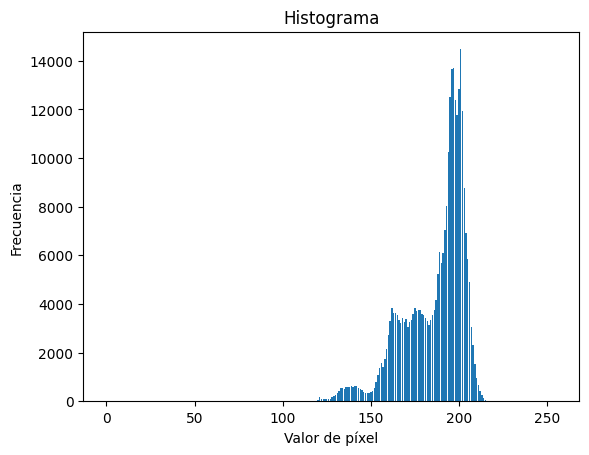

In [ ]:
# Calcula el histograma
histogram = cv2.calcHist([im], [0], None, [256], [0, 256])

# Convierte el histograma a un formato adecuado para graficar
histogram = histogram.flatten()

# Crea una gráfica de barras para visualizar el histograma
plt.bar(range(256), histogram)
plt.xlabel('Valor de píxel')
plt.ylabel('Frecuencia')
plt.title('Histograma')
plt.show()

(-0.5, 639.5, 479.5, -0.5)

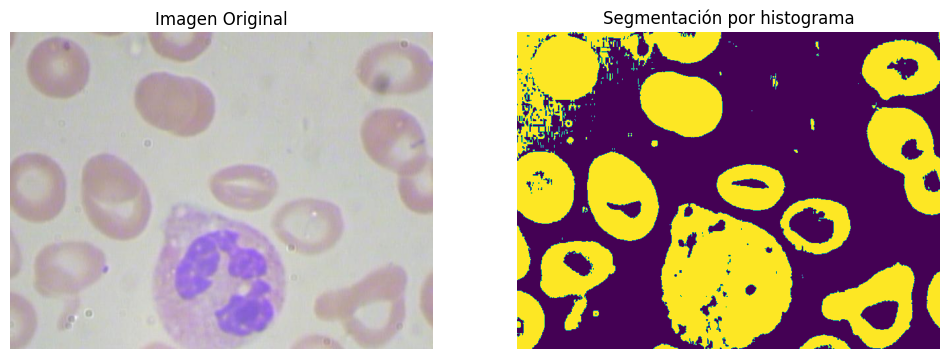

In [ ]:
plt.figure(figsize=(12, 6))  

# Mostrar la imagen original en el lado izquierdo
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))  
plt.title('Imagen Original')
plt.axis('off') 

plt.subplot(1, 2, 2)
plt.imshow(im < 190) 
plt.title('Segmentación por histograma')
plt.axis('off') 


In [ ]:
img2 = cv2.imread('/work/imágenes_proyecto/img_proyecto2.jpg')
im = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

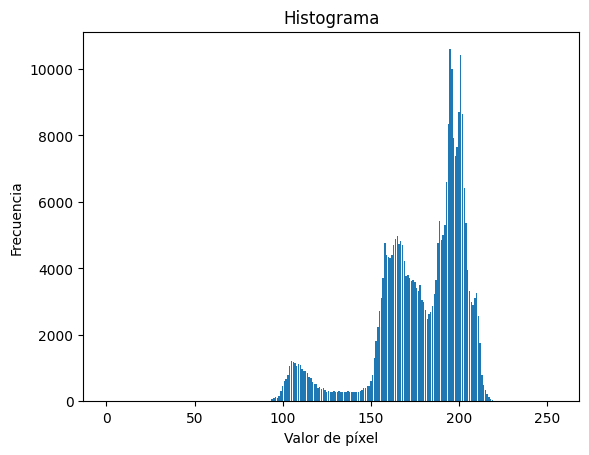

In [ ]:
# Calcula el histograma
histogram = cv2.calcHist([im], [0], None, [256], [0, 256])

# Convierte el histograma a un formato adecuado para graficar
histogram = histogram.flatten()

# Crea una gráfica de barras para visualizar el histograma
plt.bar(range(256), histogram)
plt.xlabel('Valor de píxel')
plt.ylabel('Frecuencia')
plt.title('Histograma')
plt.show()

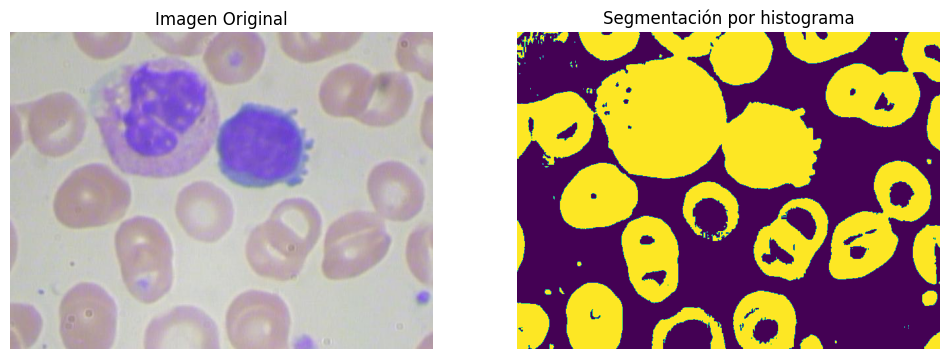

In [ ]:
plt.figure(figsize=(12, 6))  

# Mostrar la imagen original en el lado izquierdo
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))  
plt.title('Imagen Original')
plt.axis('off') 

plt.subplot(1, 2, 2)
plt.imshow(im < 185) 
plt.title('Segmentación por histograma')
plt.axis('off') 

plt.show()

In [ ]:
img3 = cv2.imread('/work/imágenes_proyecto/img_proyecto3.jpg')
im = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

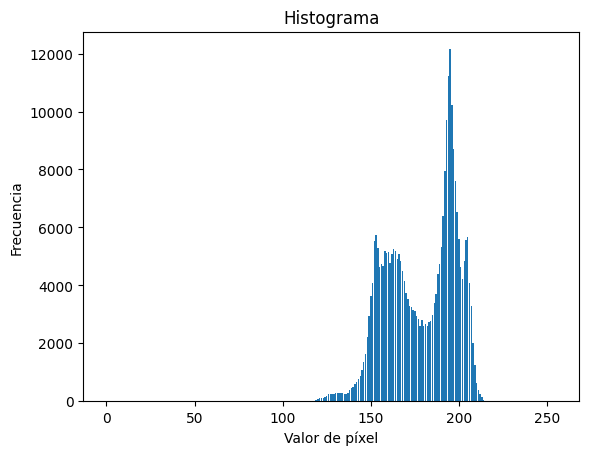

In [ ]:
# Calcula el histograma
histogram = cv2.calcHist([im], [0], None, [256], [0, 256])

# Convierte el histograma a un formato adecuado para graficar
histogram = histogram.flatten()

# Crea una gráfica de barras para visualizar el histograma
plt.bar(range(256), histogram)
plt.xlabel('Valor de píxel')
plt.ylabel('Frecuencia')
plt.title('Histograma')
plt.show()

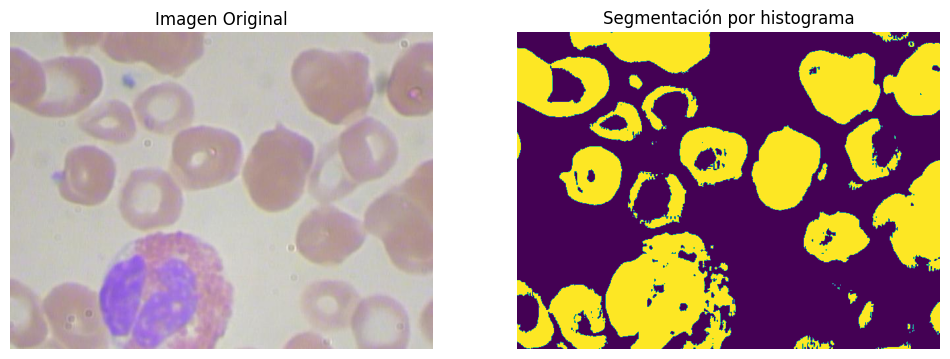

In [ ]:
plt.figure(figsize=(12, 6))  

# Mostrar la imagen original en el lado izquierdo
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))  
plt.title('Imagen Original')
plt.axis('off') 

plt.subplot(1, 2, 2)
plt.imshow(im < 170) 
plt.title('Segmentación por histograma')
plt.axis('off') 

plt.show()

In [ ]:
# Convierte la imagen a escala de grises
img4 = cv2.imread('/work/imágenes_proyecto/img_proyecto4.jpg')
im = cv2.cvtColor(img4, cv2.COLOR_BGR2GRAY)

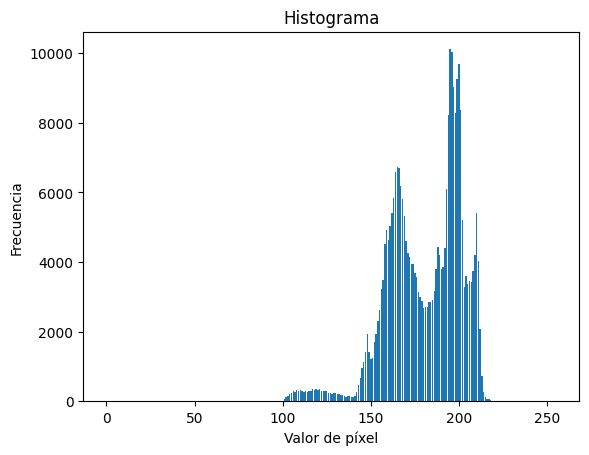

In [ ]:
# Calcula el histograma
histogram = cv2.calcHist([im], [0], None, [256], [0, 256])

# Convierte el histograma a un formato adecuado para graficar
histogram = histogram.flatten()

# Crea una gráfica de barras para visualizar el histograma
plt.bar(range(256), histogram)
plt.xlabel('Valor de píxel')
plt.ylabel('Frecuencia')
plt.title('Histograma')
plt.show()

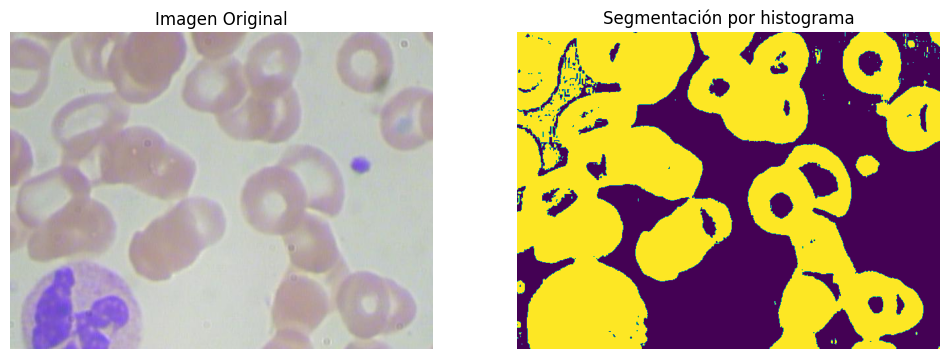

In [ ]:
plt.figure(figsize=(12, 6))  

# Mostrar la imagen original en el lado izquierdo
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img4, cv2.COLOR_BGR2RGB))  
plt.title('Imagen Original')
plt.axis('off') 

plt.subplot(1, 2, 2)
plt.imshow(im < 190) 
plt.title('Segmentación por histograma')
plt.axis('off') 

plt.show()

In [ ]:
# Convierte la imagen a escala de grises
img5 = cv2.imread('/work/imágenes_proyecto/img_proyecto5.jpg')
im = cv2.cvtColor(img5, cv2.COLOR_BGR2GRAY)

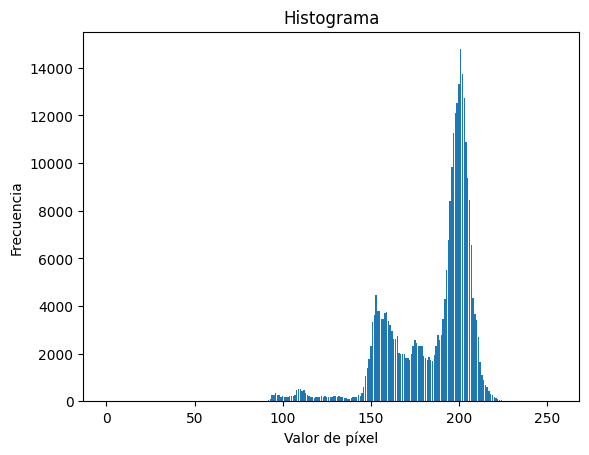

In [ ]:
# Calcula el histograma
histogram = cv2.calcHist([im], [0], None, [256], [0, 256])

# Convierte el histograma a un formato adecuado para graficar
histogram = histogram.flatten()

# Crea una gráfica de barras para visualizar el histograma
plt.bar(range(256), histogram)
plt.xlabel('Valor de píxel')
plt.ylabel('Frecuencia')
plt.title('Histograma')
plt.show()

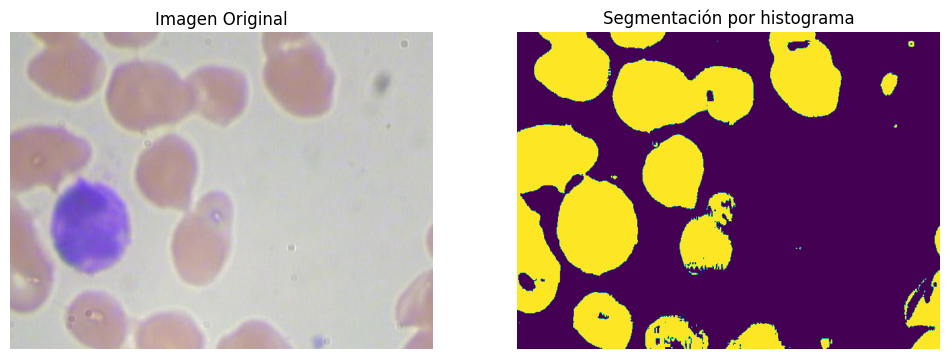

In [ ]:
plt.figure(figsize=(12, 6))  

# Mostrar la imagen original en el lado izquierdo
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img5, cv2.COLOR_BGR2RGB))  
plt.title('Imagen Original')
plt.axis('off') 

plt.subplot(1, 2, 2)
plt.imshow(im < 180) 
plt.title('Segmentación por histograma')
plt.axis('off') 

plt.show()

## Umbralizar Imágenes

La función umbralized_cells representa un procedimiento de procesamiento de imágenes que busca resaltar las células presentes en una imagen. Primero, carga la imagen en formato de escala de grises y luego realiza una operación de umbralización, destacando las áreas que superan un umbral específico en color blanco, mientras que el fondo, por debajo de ese umbral, se muestra en color negro. Posteriormente, se aplican operaciones morfológicas, como erosión y dilatación, con el propósito de mejorar la definición y la precisión de la segmentación celular. La función finaliza mostrando visualmente la imagen original y la versión umbralizada, permitiendo una comparación directa entre ambas para evaluar la calidad de la segmentación realizada.

In [ ]:
def umbralized_cells(image_path, cell_threshold):
    # Cargar la imagen en escala de grises
    img = cv2.imread(image_path)  

    img_copy = img.copy()

    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    if img is None:
        raise ValueError("No se pudo cargar la imagen.")

    # Aplicar umbralización para resaltar las células en blanco y el fondo en negro
    _, thresholded = cv2.threshold(img_gray, cell_threshold, 255, cv2.THRESH_BINARY_INV)

    # Aplicar operaciones morfológicas para mejorar la segmentación
    kernel = np.ones((3, 3), np.uint8)
    # Erosión y dilatación para mejorar la definición de las células
    thresholded = cv2.erode(thresholded, kernel, iterations=1)
    thresholded = cv2.dilate(thresholded, kernel, iterations=2)

    # Mostrar la imagen segmentada
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_copy)  
    plt.title('Imagen original')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Células segmentadas')
    plt.axis('off')

    plt.show()

    return thresholded

## Dilatar imágenes umbralizádas

La función dilate_segmented_images toma un diccionario que contiene imágenes segmentadas y, mediante el uso de la operación de dilatación morfológica de OpenCV, procesa cada imagen en el diccionario con un kernel definido por el usuario. La dilatación se aplica a cada imagen, y luego, visualiza las imágenes dilatadas con sus respectivas etiquetas de identificación en una sola figura. Este proceso de dilatación y visualización se realiza para cada imagen contenida en el diccionario. Finalmente, la función retorna un diccionario que contiene las imágenes segmentadas después de haber sido sometidas al proceso de dilatación. En resumen, esta función permite no solo dilatar las imágenes, sino también visualizar de manera conveniente el resultado de la dilatación de múltiples imágenes segmentadas en una sola representación gráfica.

In [ ]:
def dilate_umbralized_cells(umbralized_img, kernel_size):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)

    # Convertir la imagen procesada a escala de grises si es a color
    if len(umbralized_img.shape) > 2:
        umbralized_img = cv2.cvtColor(umbralized_img, cv2.COLOR_BGR2GRAY)

    # Realizar la dilatación
    dilated = cv2.dilate(umbralized_img, kernel, iterations=1)

    # Mostrar la imagen original y la imagen dilatada
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].imshow(umbralized_img, cmap='gray')
    axes[0].set_title('Imagen umbralizada')
    axes[0].axis('off')

    axes[1].imshow(dilated, cmap='gray')
    axes[1].set_title('Imagen Procesada Dilatada')
    axes[1].axis('off')

    plt.show()

    return dilated

## Aplicar transformada de watershed

La función "watershed_cells" toma una imagen como entrada y lleva a cabo una serie de operaciones para segmentar regiones de interés en la imagen. Comienza realizando un suavizado mediante desenfoque gaussiano y aplica un umbral adaptativo para obtener una imagen binaria. Luego, se ejecutan operaciones de erosión y dilatación para resaltar y modificar las áreas de interés. Se calcula la transformada de la distancia y se identifican las regiones de primer plano y fondo. Utiliza el algoritmo de Watershed de OpenCV para segmentar y separar las regiones de la imagen. Posteriormente, genera un gráfico que muestra la imagen original junto con el resultado de la segmentación mediante Watershed, destacando las áreas segmentadas con colores distintos. La función devuelve la imagen segmentada mediante Watershed. Esta técnica es comúnmente utilizada en la segmentación de imágenes para identificar contornos y delimitar áreas de interés separadas en una imagen.

In [ ]:
def watershed_cells(img, dist_transform_scale, dilate_kernel_size, dilate_iterations, erode_kernel_size, erode_iterations):
    blur = cv2.GaussianBlur(img, (3, 3), 0)
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Adding an erosion step
    erosion_kernel = np.ones((erode_kernel_size, erode_kernel_size), np.uint8)
    img_eroded = cv2.erode(thresh, erosion_kernel, iterations=erode_iterations)

    # Applying opening operation (erosion followed by dilation)
    opening_kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size for opening
    img_opened = cv2.morphologyEx(img_eroded, cv2.MORPH_OPEN, opening_kernel)

    sure_bg = cv2.dilate(img_opened, np.ones((dilate_kernel_size, dilate_kernel_size), np.uint8), iterations=dilate_iterations)
    dist_transform = cv2.distanceTransform(img_opened, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, dist_transform_scale * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)

    _, markers = cv2.connectedComponents(sure_fg)
    markers += 1
    markers[unknown == 255] = 0

    watershed = cv2.watershed(cv2.cvtColor(img, cv2.COLOR_GRAY2BGR), markers)

    # Displaying the results in a plot
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Eroded Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(watershed, cmap='jet')  # cmap='jet' is a color map for highlighting segmented areas
    plt.title('Watershed Result')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return watershed

La función clasificar_celulas toma el resultado del algoritmo de Watershed aplicado a una imagen para clasificar las células identificadas en tres categorías principales: glóbulos rojos, glóbulos blancos y plaquetas. Utiliza los tamaños de las células identificadas en el resultado de Watershed para esta clasificación.

Finalmente, devuelve un diccionario que contiene las etiquetas de las células clasificadas como glóbulos rojos, glóbulos blancos y plaquetas, respectivamente. Esta función proporciona una forma de segmentar y clasificar automáticamente diferentes tipos de células en una imagen utilizando los resultados del algoritmo de Watershed.

## Clasificar células 

La función mostrar_areas_celulares utiliza la biblioteca regionprops de scikit-image para obtener propiedades de las regiones etiquetadas en la imagen resultante del algoritmo de Watershed. Después, colorea y etiqueta las diferentes áreas correspondientes a células identificadas en la imagen para su visualización.

Primero, la función toma la imagen original y la imagen resultante del proceso de Watershed y las convierte en matrices numpy en formato uint8 para trabajar con ellas. Luego, utiliza regionprops para obtener propiedades como el tamaño y la forma de las regiones identificadas en la imagen segmentada.

Posteriormente, define un diccionario que asocia colores a diferentes tipos de células identificadas (glóbulos rojos, glóbulos blancos y plaquetas). Utiliza las propiedades de las regiones para clasificar las células según su tamaño relativo en comparación con el tamaño promedio de las células identificadas.

Luego, recorre las regiones etiquetadas, identifica el tipo de célula según su tamaño relativo y resalta cada área con un rectángulo coloreado según el tipo de célula. Además, agrega una etiqueta de texto indicando el tipo de célula en cada región.

Finalmente, muestra dos imágenes utilizando Matplotlib: la imagen original y la imagen con las áreas de células resaltadas y etiquetadas, lo que proporciona una representación visual de la segmentación y clasificación de las células identificadas en la imagen original.

In [ ]:
from skimage.measure import regionprops

def mostrar_areas_celulares(img_original, img_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral):
    img_original = np.uint8(cv2.imread(img_original))
    img_watershed = np.uint8(img_watershed)

    propiedades = regionprops(img_watershed)

    cell_colors = {'globulos_rojos': (0, 0, 255), 'globulos_blancos': (0, 255, 0), 'plaquetas': (255, 0, 0)}

    img_con_areas = np.copy(img_original)

    cell_sizes = [region.area for region in propiedades]
    avg_size = np.mean(cell_sizes)

    cell_counts = {'globulos_rojos': 0, 'globulos_blancos': 0, 'plaquetas': 0}

    for region in propiedades:
        size = region.area

        min_row, min_col, max_row, max_col = region.bbox
        height = max_row - min_row
        width = max_col - min_col
        aspect_ratio = width / height

        if (
            size > valor_blancos * avg_size and
            aspect_ratio < aspect_ratio_threshold and
            size > 1000  # Considerar solo regiones con un área mínima
        ):
            # Verificar el tamaño y la forma en relación con los glóbulos blancos
            if size > 2 * avg_size and aspect_ratio < 0.7:  # Ajusta estos valores según sea necesario
                cell_type = 'globulos_rojos'  # Clasificar como glóbulos rojos
            else:
                cell_type = 'globulos_blancos'  # Clasificar como glóbulos blancos
        elif size < valor_plaquetas * avg_size:
            cell_type = 'plaquetas'  # Clasificar como plaquetas
        else:
            area = region.area
            perimeter = region.perimeter
            compacidad = 4 * np.pi * area / (perimeter * perimeter)
            solidez = region.solidity
            circularidad = region.equivalent_diameter / region.major_axis_length

            if (
                solidez > solidez_umbral or
                (compacidad > compacidad_umbral and circularidad < circularidad_umbral)
            ):
                cell_type = 'globulos_rojos'  # Clasificar como glóbulos rojos
            else:
                cell_type = 'globulos_blancos'  # Clasificar como glóbulos blancos si no es claramente rojo

        # Evitar contornos en los bordes de la imagen
        if min_row > 0 and min_col > 0 and max_row < img_watershed.shape[0] and max_col < img_watershed.shape[1]:
            # Contar el tipo de célula
            cell_counts[cell_type] += 1

            cv2.rectangle(img_con_areas, (min_col, min_row), (max_col, max_row), cell_colors[cell_type], 2)
            cv2.putText(img_con_areas, f"{cell_type}", (min_col, min_row - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
    plt.title('Imagen Original')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_con_areas, cv2.COLOR_BGR2RGB))
    plt.title('Imagen con áreas de células resaltadas y etiquetadas')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Retornar el número de células por tipo
    return cell_counts

## Detectar anemia

La función es_anemia proporcionada, opera sobre dos imágenes: img_original y img_watershed. En primer lugar, convierte estas imágenes a formato uint8 usando la biblioteca OpenCV. Luego, utiliza el algoritmo de segmentación Watershed para identificar y extraer las propiedades de las regiones en la imagen segmentada, asumiendo que estas regiones corresponden a glóbulos rojos.

A través de un bucle que itera sobre estas propiedades, la función filtra los glóbulos que no cumplen ciertos criterios de tamaño, presumiblemente descartando glóbulos blancos o plaquetas. Para las regiones que pasan este filtro, extrae las áreas correspondientes en la imagen original y calcula la intensidad promedio de los glóbulos rojos en estas áreas.

Después, evalúa si la intensidad promedio supera un umbral predefinido (umbral_anemia). Esto permite determinar si la persona asociada con esa imagen tiene anemia o no, almacenando estos resultados como booleanos en una lista llamada resultados_anemia.

Luego, la función calcula el porcentaje de resultados positivos en relación con el umbral de anemia y muestra este porcentaje. Si este porcentaje alcanza un umbral predefinido (100% o 80%), la función emite un diagnóstico, indicando si la persona tiene o no anemia.

Además del análisis diagnóstico, la función calcula el umbral de intensidad promedio de los glóbulos rojos y crea una máscara con los píxeles que superan este umbral. Utilizando Matplotlib, muestra tanto la imagen original como la máscara resultante para visualizar cómo se segmentan los glóbulos rojos en la imagen original con respecto al umbral de anemia.

Finalmente, la función devuelve una lista de intensidades de glóbulos rojos y un resultado final que indica si se detecta anemia o no en la imagen analizada.

In [ ]:
def es_anemia(img_original, img_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral):
    img_original = np.uint8(cv2.imread(img_original))
    img_watershed = np.uint8(img_watershed)

    propiedades = regionprops(img_watershed)

    intensidades_globulos_rojos = []
    umbral_intensidad_promedio = 0  # Inicializa el umbral de intensidad promedio

    resultados_anemia = []

    for region in propiedades:
        size = region.area
        min_row, min_col, max_row, max_col = region.bbox

        # Filtrar solo los glóbulos rojos identificados
        if (
            size > valor_blancos * np.mean([r.area for r in propiedades]) or
            size < valor_plaquetas * np.mean([r.area for r in propiedades])
        ):
            continue  # No procesar glóbulos blancos o plaquetas

        # Obtener la región correspondiente a los glóbulos rojos en la imagen original
        globulos_rojos = img_original[min_row:max_row, min_col:max_col]

        # Calcular la intensidad promedio de los glóbulos rojos
        intensidad_promedio = np.mean(globulos_rojos)

        intensidades_globulos_rojos.append(intensidad_promedio)

        # Determinar si la imagen corresponde a una persona con anemia
        umbral_anemia = 175  # Ajusta este valor según sea necesario
        es_anemia = intensidad_promedio > umbral_anemia
        resultados_anemia.append(es_anemia)

    # Calcular el porcentaje de resultados positivos
    porcentaje_positivos = sum(resultados_anemia) / len(resultados_anemia) * 100

    # Analizar el resultado
    print(f"Porcentaje de resultados positivos: {porcentaje_positivos}%")

    # Si el porcentaje es del 100% o del 80%, diagnosticar anemia
    if porcentaje_positivos == 100 or porcentaje_positivos >= 80:
        print("La persona tiene anemia.")
        resultado_final = "Anemia"
    else:
        print("La persona no tiene anemia.")
        resultado_final = "No anemia"

    # Calcular el umbral de intensidad promedio de los glóbulos rojos
    umbral_intensidad_promedio = np.mean(intensidades_globulos_rojos)
    print(f"Umbral de intensidad promedio de glóbulos rojos: {umbral_intensidad_promedio}")

    # Crear una máscara con los píxeles que superan el umbral de intensidad promedio
    img_umbral = np.zeros_like(img_original[:, :, 0])
    img_umbral[img_original[:, :, 0] > umbral_intensidad_promedio] = 255  # Píxeles por encima del umbral se marcan como blanco

    # Mostrar la imagen original y la máscara de umbral utilizando Matplotlib
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Imagen Original')
    axs[0].axis('off')

    axs[1].imshow(img_umbral, cmap='gray')
    axs[1].set_title('Umbral de intensidad promedio de glóbulos rojos')
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

    return intensidades_globulos_rojos, resultado_final


## Procesamiento primera imagen

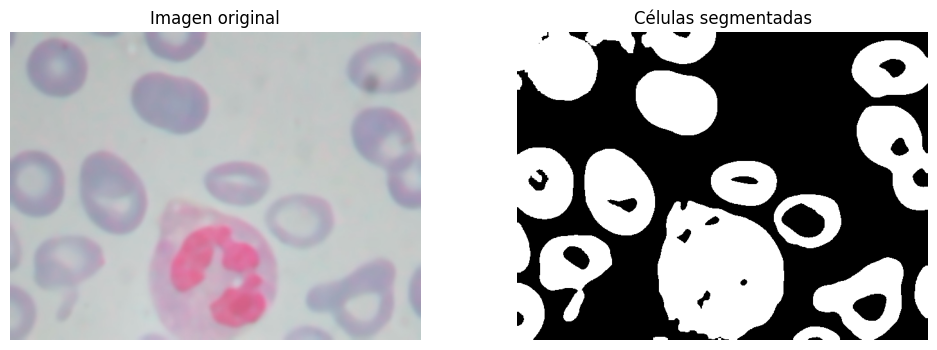

In [ ]:
image_path = '/work/imágenes_proyecto/img1_preprocessed.jpg'

cell_threshold = 187 
img1_umbralized = umbralized_cells(image_path, cell_threshold)

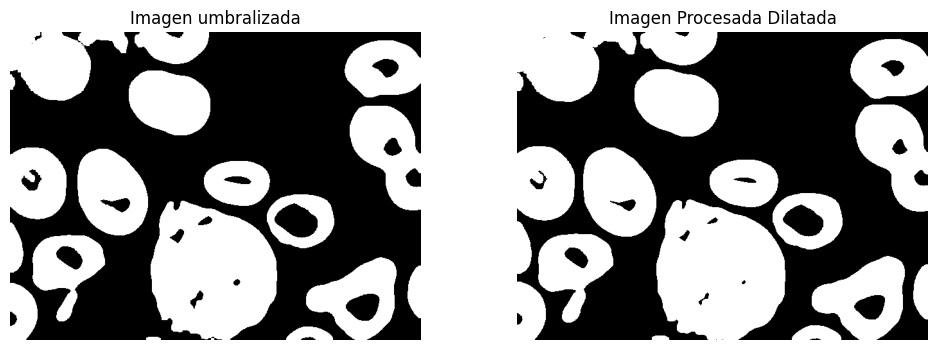

In [ ]:
kernel_size=(5, 5) 
img1_dilateded = dilate_umbralized_cells(img1_umbralized, kernel_size)

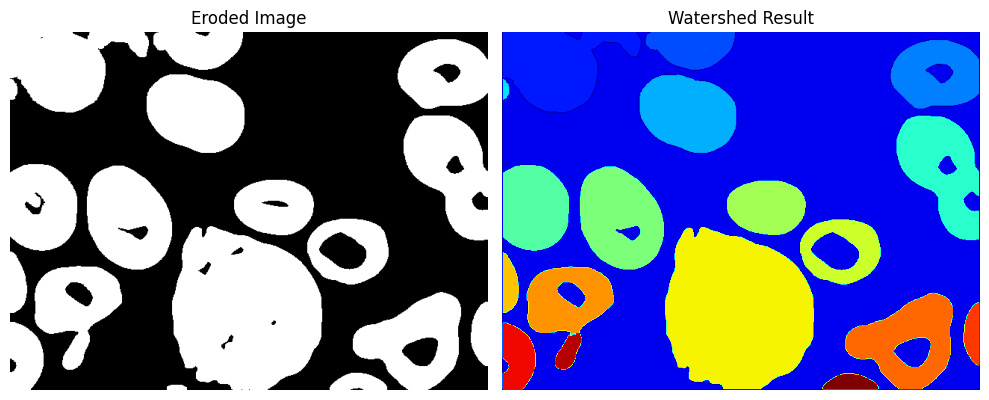

In [ ]:
dist_transform_scale = 0.1
dilate_kernel_size = 3
dilate_iterations = 7
erode_kernel_size = 2
erode_iterations = 3

img1_watershed = watershed_cells(img1_dilateded, dist_transform_scale, dilate_kernel_size, dilate_iterations, erode_kernel_size, erode_iterations)

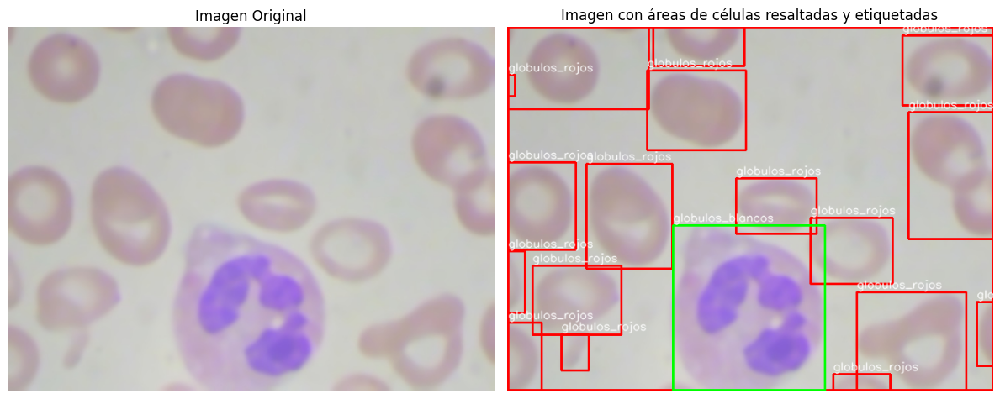

{'globulos_rojos': 18, 'globulos_blancos': 1, 'plaquetas': 0}

In [ ]:
image_path = '/work/imágenes_proyecto/img1_preprocessed.jpg'

valor_blancos = 0.9
valor_plaquetas = 0.01
aspect_ratio_threshold = 1.0
compacidad_umbral  = 0.1
solidez_umbral = 0.1
circularidad_umbral = 0.1

mostrar_areas_celulares(image_path, img1_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

Porcentaje de resultados positivos: 94.44444444444444%
La persona tiene anemia.
Umbral de intensidad promedio de glóbulos rojos: 183.0760917046415


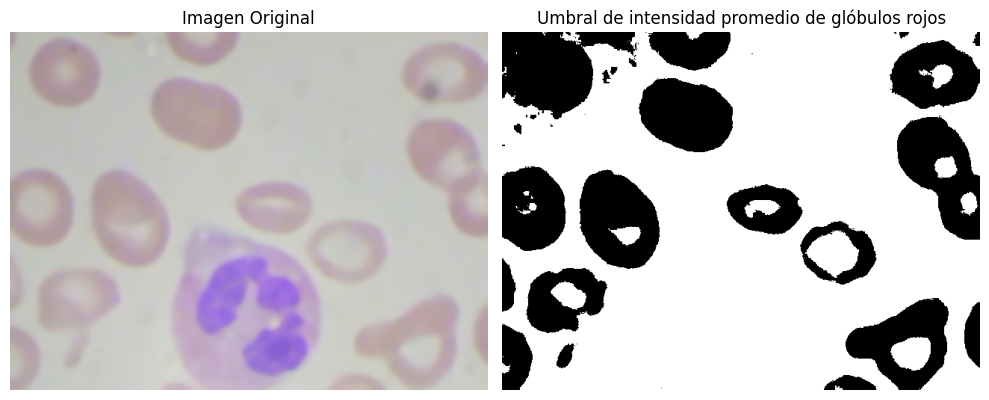

Umbral actual: [178.025008341675, 176.18899782135077, 178.83917914992082, 174.48647130647132, 186.10449735449737, 182.84634334933736, 176.60928187591597, 180.09390363815143, 185.55647454122513, 190.60408684546616, 184.93602693602693, 185.63535894305124, 187.39547444731554, 180.76001511715796, 181.05064691862444, 190.05015432098764, 188.49671957671958, 187.69101019965277]
Diagnóstico: Anemia


In [ ]:
valor_blancos = 0.9
valor_plaquetas = 0.01
aspect_ratio_threshold = 1.0
compacidad_umbral  = 0.1
solidez_umbral = 0.1
circularidad_umbral = 0.1

# Llamada a la función
umbral_actual, diagnostico = es_anemia(image_path, img1_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

# Imprimir resultado
print(f"Umbral actual: {umbral_actual}")
print(f"Diagnóstico: {diagnostico}")

## Procesamiento segunda imagen

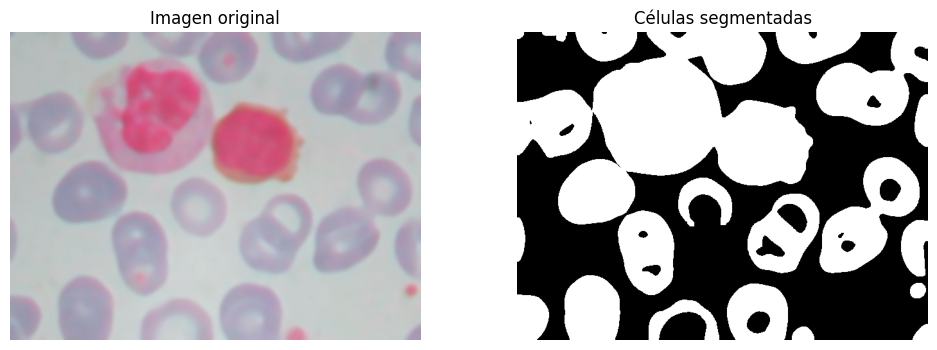

In [ ]:
image_path = '/work/imágenes_proyecto/img2_preprocessed.jpg'

cell_threshold = 183 
img2_umbralized = umbralized_cells(image_path, cell_threshold)

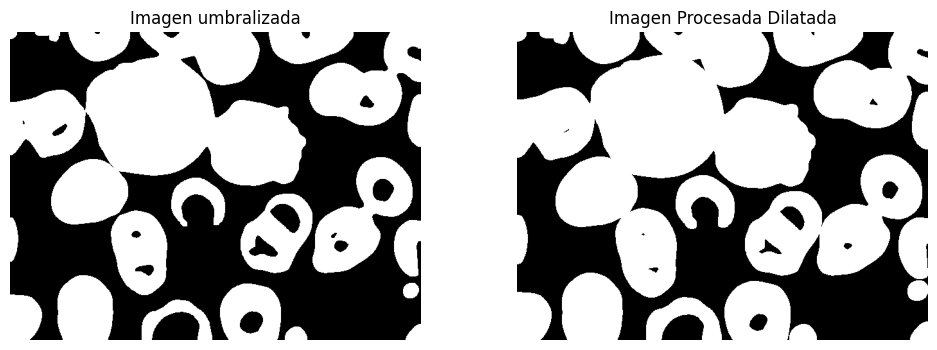

In [ ]:
kernel_size=(9, 9) 
img2_dilateded = dilate_umbralized_cells(img2_umbralized, kernel_size)

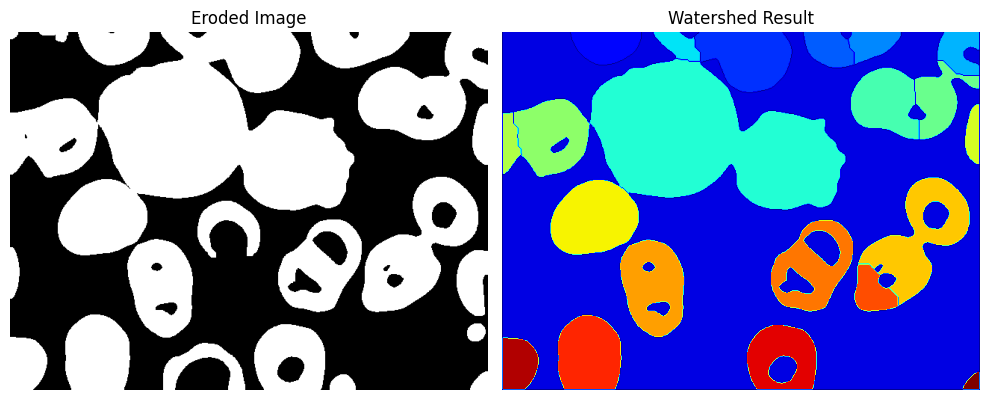

In [ ]:
dist_transform_scale = 0.2
dilate_kernel_size = 3
dilate_iterations = 3
erode_kernel_size = 3
erode_iterations = 1

img2_watershed = watershed_cells(img2_umbralized, dist_transform_scale, dilate_kernel_size, dilate_iterations, erode_kernel_size, erode_iterations)

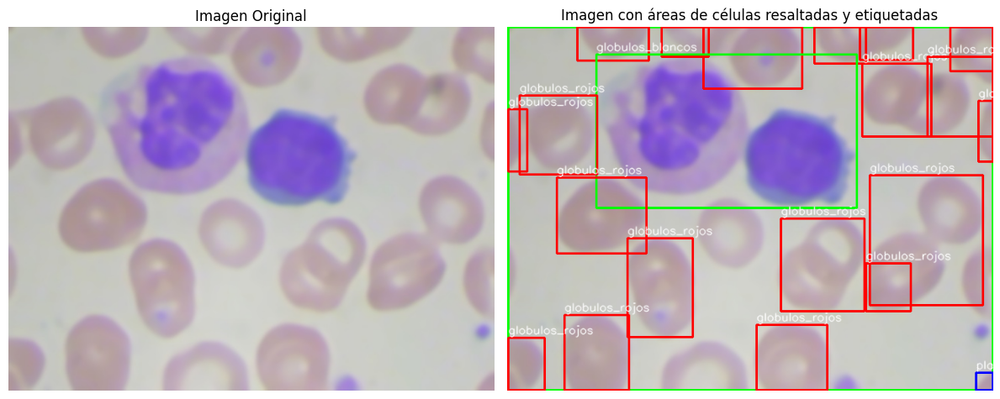

{'globulos_rojos': 19, 'globulos_blancos': 2, 'plaquetas': 1}

In [ ]:
image_path = '/work/imágenes_proyecto/img2_preprocessed.jpg'

valor_blancos = 1.5  # Umbral para glóbulos blancos
valor_plaquetas = 0.05  # Umbral para plaquetas
aspect_ratio_threshold = 2 # Aumentar el umbral de relación de aspecto
compacidad_umbral = 0.1 # Reducir el umbral de compacidad
solidez_umbral = 0.1 # Umbral de solidez
circularidad_umbral = 0.1

mostrar_areas_celulares(image_path, img2_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral) 

Porcentaje de resultados positivos: 40.0%
La persona no tiene anemia.
Umbral de intensidad promedio de glóbulos rojos: 175.25629446304052


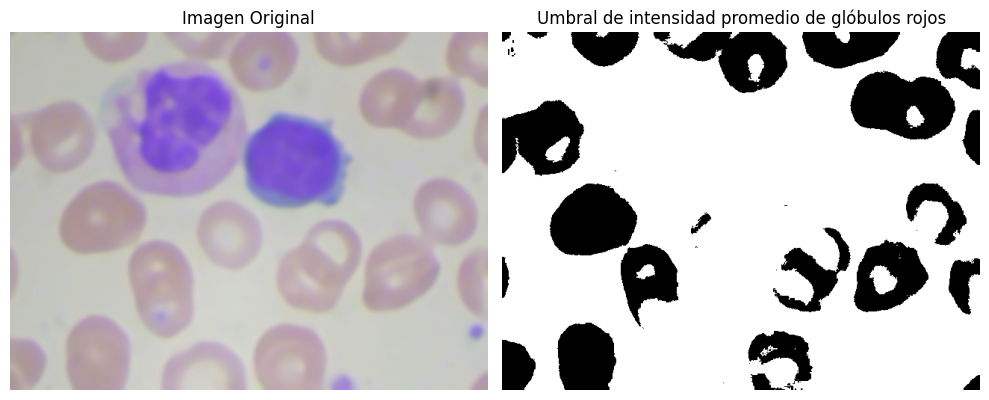

Umbral actual: [171.02417794970987, 169.47666983222538, 172.1031454248366, 173.2157253599114, 170.9113300492611, 177.55376344086022, 172.35298382173383, 176.40431893687708, 173.40840246354952, 171.21756097560976, 174.76118421052632, 168.31728813559323, 183.4933212972775, 180.34716756112104, 186.7889220069548, 176.24024751143395, 173.15575361457715, 182.2692756522464, 170.61463365539453, 181.4700173611111]
Diagnóstico: No anemia


In [ ]:
valor_blancos = 1.5  # Umbral para glóbulos blancos
valor_plaquetas = 0.05  # Umbral para plaquetas
aspect_ratio_threshold = 2 # Aumentar el umbral de relación de aspecto
compacidad_umbral = 0.1 # Reducir el umbral de compacidad
solidez_umbral = 0.1 # Umbral de solidez
circularidad_umbral = 0.1

# Llamada a la función
umbral_actual, diagnostico = es_anemia(image_path, img2_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

# Imprimir resultado
print(f"Umbral actual: {umbral_actual}")
print(f"Diagnóstico: {diagnostico}")

## Procesamiento tercera imagen

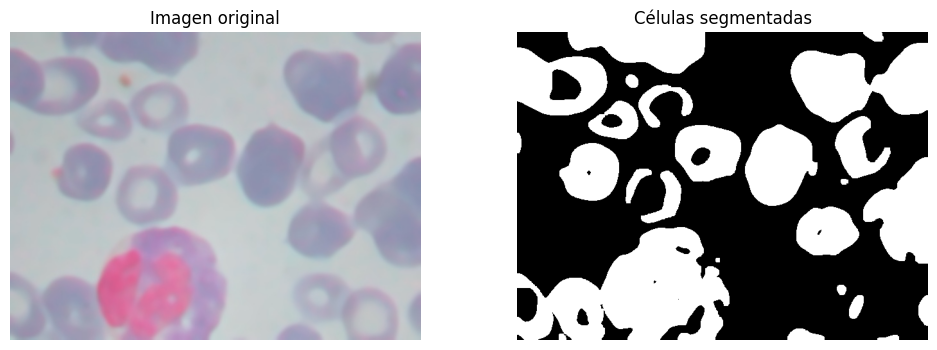

In [ ]:
image_path = '/work/imágenes_proyecto/img3_preprocessed.jpg'

cell_threshold = 170 
img3_umbralized = umbralized_cells(image_path, cell_threshold)

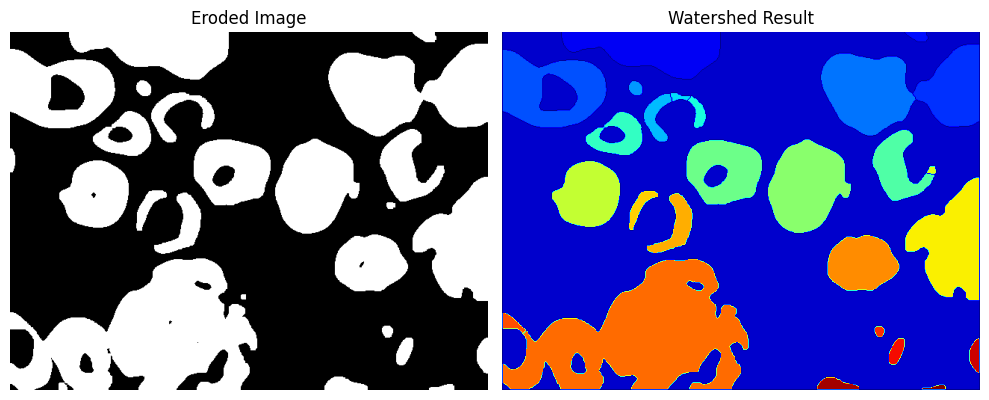

In [ ]:
dist_transform_scale = 0.1
dilate_kernel_size = 3
dilate_iterations = 3
erode_kernel_size = 0
erode_iterations = 0

img3_watershed = watershed_cells(img3_umbralized, dist_transform_scale, dilate_kernel_size, dilate_iterations, erode_kernel_size, erode_iterations)

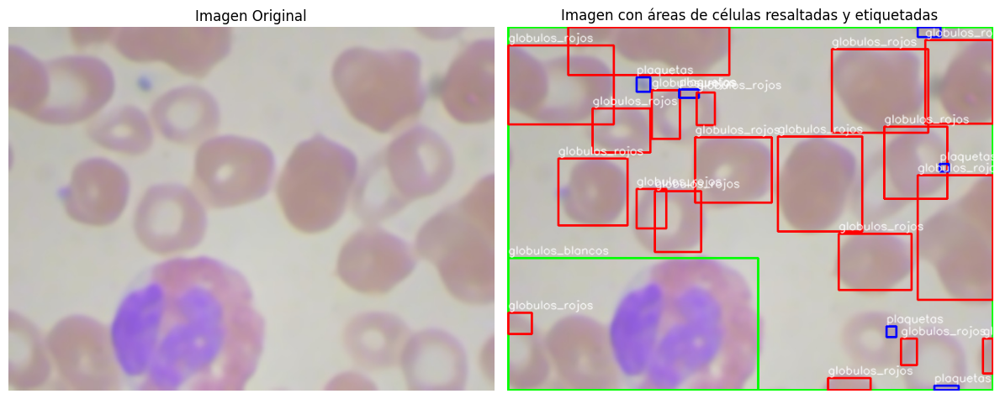

{'globulos_rojos': 19, 'globulos_blancos': 2, 'plaquetas': 6}

In [ ]:
image_path = '/work/imágenes_proyecto/img3_preprocessed.jpg'

valor_blancos = 2 # Umbral para glóbulos blancos
valor_plaquetas = 0.03  # Umbral para plaquetas
aspect_ratio_threshold = 2 # Aumentar el umbral de relación de aspecto
compacidad_umbral = 0.1 # Reducir el umbral de compacidad
solidez_umbral = 0.1  # Umbral de solidez
circularidad_umbral = 0.1

mostrar_areas_celulares(image_path, img3_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

Porcentaje de resultados positivos: 20.0%
La persona no tiene anemia.
Umbral de intensidad promedio de glóbulos rojos: 171.5968295680004


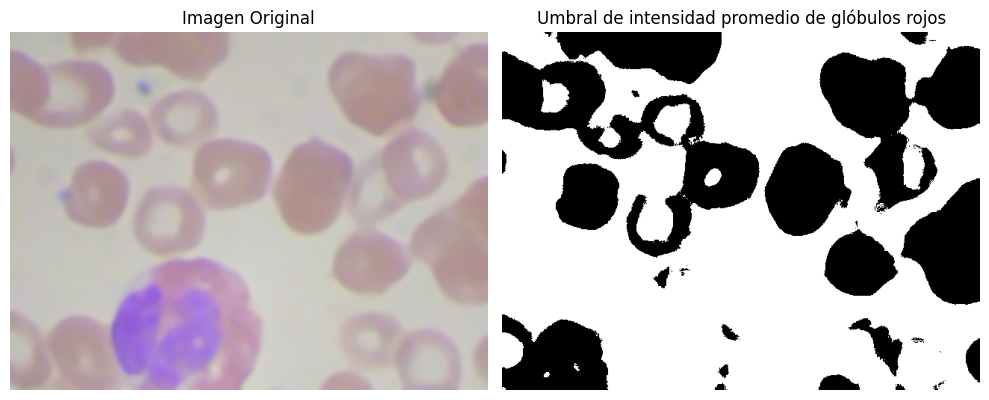

Umbral actual: [163.0234102026555, 164.88137555328566, 166.31772274488102, 166.15886423287998, 175.85613738738738, 174.55103359173125, 173.43844525105868, 174.4423166349609, 169.6413769283905, 167.7947147147147, 166.81888944388945, 170.81945470969862, 180.33316896778436, 178.8493169398907, 170.51356043543544, 174.5372503840246, 171.90839002267575, 169.3695652173913, 172.89397321428572, 179.78762478298611]
Diagnóstico: No anemia


In [ ]:
valor_blancos = 2 # Umbral para glóbulos blancos
valor_plaquetas = 0.03  # Umbral para plaquetas
aspect_ratio_threshold = 2 # Aumentar el umbral de relación de aspecto
compacidad_umbral = 0.1 # Reducir el umbral de compacidad
solidez_umbral = 0.1  # Umbral de solidez
circularidad_umbral = 0.1

# Llamada a la función
umbral_actual, diagnostico = es_anemia(image_path, img3_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

# Imprimir resultado
print(f"Umbral actual: {umbral_actual}")
print(f"Diagnóstico: {diagnostico}")

## Procesamiento cuarta imagen

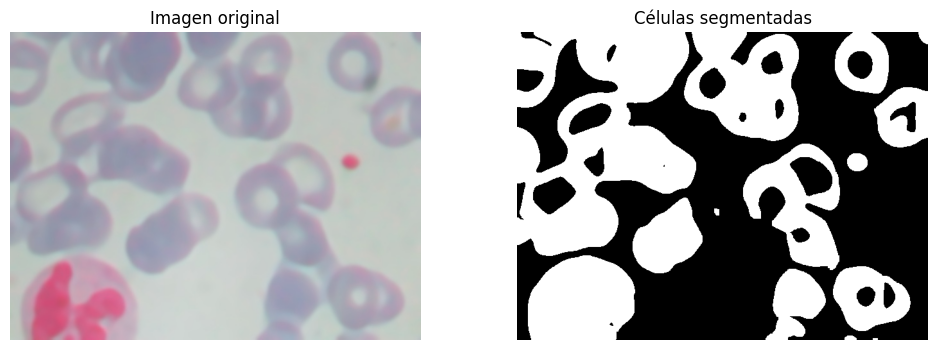

In [ ]:
image_path = '/work/imágenes_proyecto/img4_preprocessed.jpg'

cell_threshold = 176
img4_umbralized = umbralized_cells(image_path, cell_threshold)

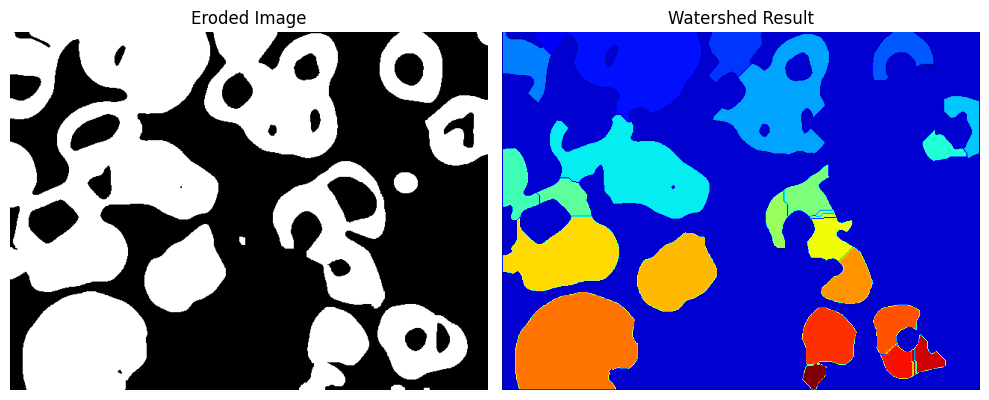

In [ ]:
dist_transform_scale = 0.2
dilate_kernel_size = 3
dilate_iterations = 3
erode_kernel_size = 3
erode_iterations = 3

img4_watershed = watershed_cells(img4_umbralized, dist_transform_scale, dilate_kernel_size, dilate_iterations, erode_kernel_size, erode_iterations)

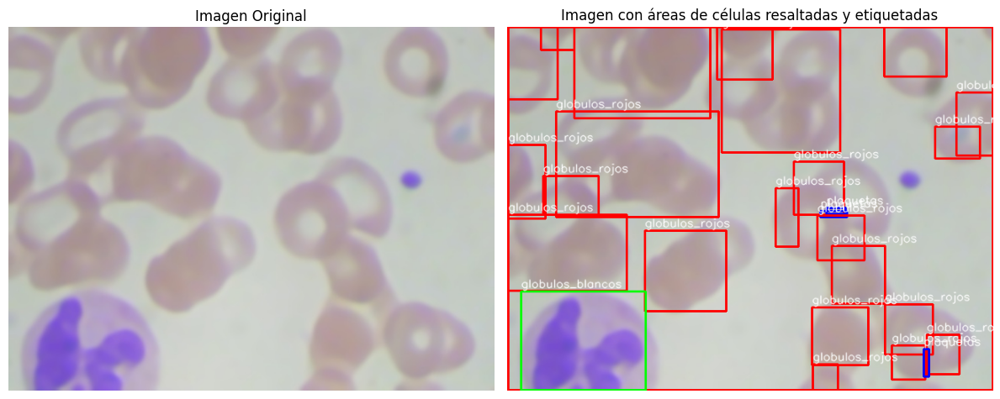

{'globulos_rojos': 23, 'globulos_blancos': 1, 'plaquetas': 3}

In [ ]:
image_path = '/work/imágenes_proyecto/img4_preprocessed.jpg'

valor_blancos = 1.3  # Umbral para glóbulos blancos
valor_plaquetas = 0.02  # Umbral para plaquetas
aspect_ratio_threshold = 1.3  # Aumentar el umbral de relación de aspecto
compacidad_umbral = 0.1 # Reducir el umbral de compacidad
solidez_umbral = 0.1  # Umbral de solidez
circularidad_umbral = 0.1

mostrar_areas_celulares(image_path, img4_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

Porcentaje de resultados positivos: 31.818181818181817%
La persona no tiene anemia.
Umbral de intensidad promedio de glóbulos rojos: 172.85818815211576


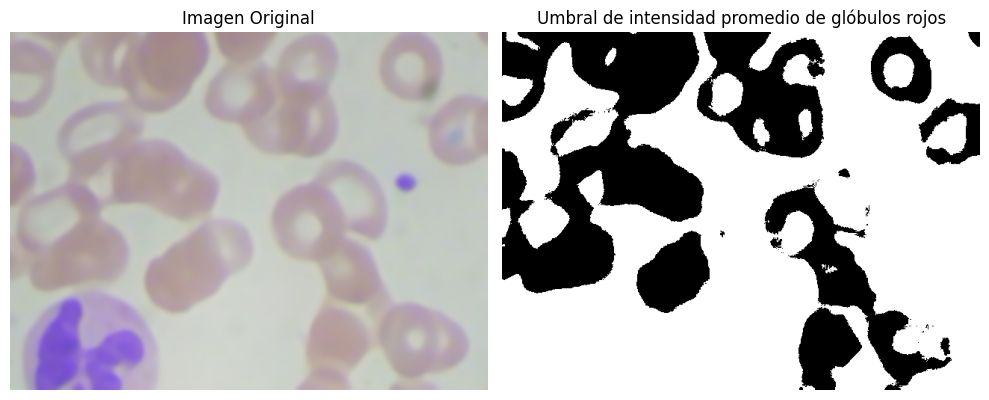

Umbral actual: [168.1, 166.1599006828057, 165.82628548739328, 175.50050031269544, 170.85819163292848, 172.11402606310014, 173.86529451137883, 174.3839117567931, 171.15667297846974, 171.80947264750648, 177.608658008658, 175.84343434343435, 171.54064151631127, 170.24267094017094, 175.84758713924646, 170.95075187969925, 175.9323392656726, 171.58837126600284, 172.91902356902358, 176.42277877161598, 173.08793820558526, 181.12168836805554]
Diagnóstico: No anemia


In [ ]:
valor_blancos = 1.3  # Umbral para glóbulos blancos
valor_plaquetas = 0.02  # Umbral para plaquetas
aspect_ratio_threshold = 1.3  # Aumentar el umbral de relación de aspecto
compacidad_umbral = 0.1 # Reducir el umbral de compacidad
solidez_umbral = 0.1  # Umbral de solidez
circularidad_umbral = 0.1

# Llamada a la función
umbral_actual, diagnostico = es_anemia(image_path, img4_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

# Imprimir resultado
print(f"Umbral actual: {umbral_actual}")
print(f"Diagnóstico: {diagnostico}")

A considerar: Anemia por deficiencia de hierro
Insuficiencia de glóbulos rojos saludables, no se ven tan rojos y algo vacíos, debido a la falta de hierro en el cuerpo.

## Procesamiento quinta imagen

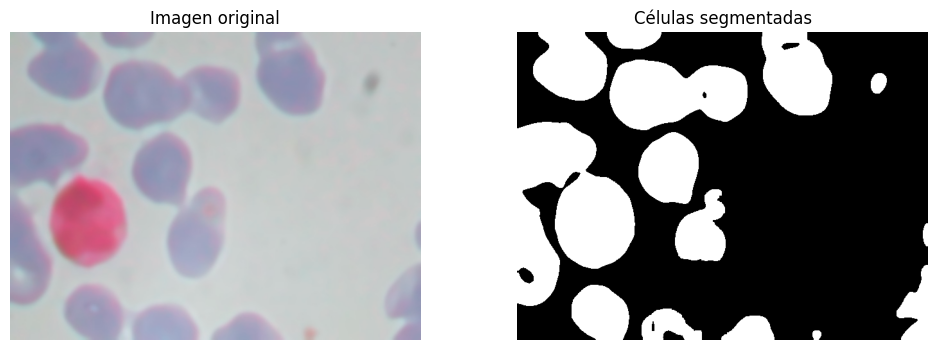

In [ ]:
image_path = '/work/imágenes_proyecto/img5_preprocessed.jpg'

cell_threshold = 178 
img5_umbralized = umbralized_cells(image_path, cell_threshold)

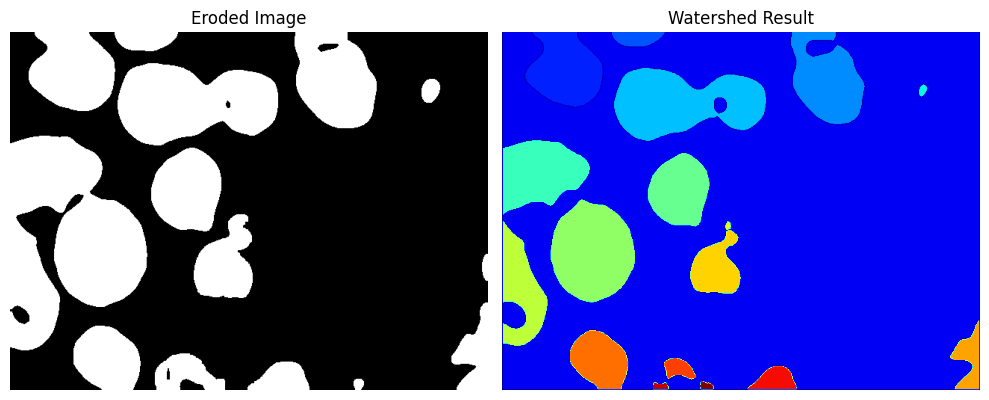

In [ ]:
dist_transform_scale = 0.1
dilate_kernel_size = 3
dilate_iterations = 3
erode_kernel_size = 3
erode_iterations = 4

img5_watershed = watershed_cells(img5_umbralized, dist_transform_scale, dilate_kernel_size, dilate_iterations, erode_kernel_size, erode_iterations)

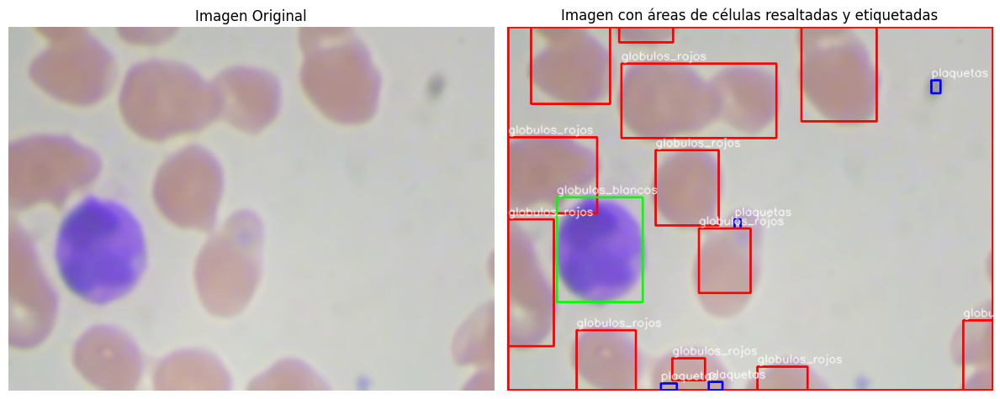

{'globulos_rojos': 13, 'globulos_blancos': 1, 'plaquetas': 4}

In [ ]:
image_path = '/work/imágenes_proyecto/img5_preprocessed.jpg'

valor_blancos = 0.7 # Umbral para glóbulos blancos
valor_plaquetas = 0.01  # Umbral para plaquetas
aspect_ratio_threshold = 1.0 # Aumentar el umbral de relación de aspecto
compacidad_umbral = 0.1 # Reducir el umbral de compacidad
solidez_umbral = 0.1 # Umbral de solidez
circularidad_umbral = 0.1

mostrar_areas_celulares(image_path, img5_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

Porcentaje de resultados positivos: 33.33333333333333%
La persona no tiene anemia.
Umbral de intensidad promedio de glóbulos rojos: 170.80936930103982


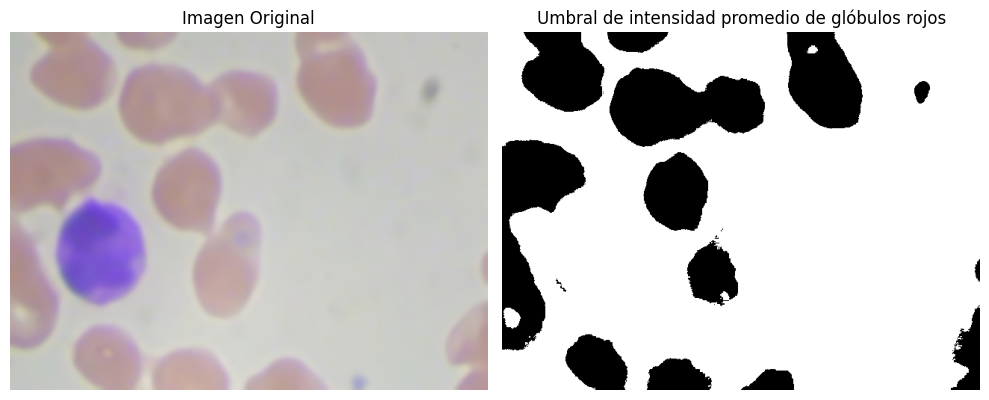

Umbral actual: [161.1490860624524, 162.86220657276996, 166.1623221461931, 160.0031623931624, 165.9833272483875, 170.59644045242848, 177.25570934256055, 174.07840951319213, 171.79319485015688, 176.73429564287625, 176.82893450635387, 186.26534288194443]
Diagnóstico: No anemia


In [ ]:
valor_blancos = 0.7 # Umbral para glóbulos blancos
valor_plaquetas = 0.01  # Umbral para plaquetas
aspect_ratio_threshold = 1.0 # Aumentar el umbral de relación de aspecto
compacidad_umbral = 0.1 # Reducir el umbral de compacidad
solidez_umbral = 0.1 # Umbral de solidez
circularidad_umbral = 0.1

# Llamada a la función
umbral_actual, diagnostico = es_anemia(image_path, img5_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

# Imprimir resultado
print(f"Umbral actual: {umbral_actual}")
print(f"Diagnóstico: {diagnostico}")

## Anemia Ferropénica

La anemia ferropénica es un trastorno hematológico común y se considera el tipo más frecuente de anemia. Se produce cuando el cuerpo no tiene suficiente hierro para producir hemoglobina en cantidad adecuada. La hemoglobina es una proteína en los glóbulos rojos que transporta oxígeno a los tejidos del cuerpo.

Esta afección puede surgir debido a una ingesta insuficiente de hierro en la dieta, pérdida excesiva de sangre (por ejemplo, a través de períodos menstruales abundantes o sangrado gastrointestinal) o una incapacidad del cuerpo para absorber el hierro de manera efectiva.

A nivel hematológico, la anemia ferropénica se caracteriza por niveles bajos de hemoglobina y hematocrito en el análisis de sangre, así como por la presencia de glóbulos rojos más pequeños y pálidos (microcíticos y hipocrómicos, respectivamente) bajo el microscopio.

Para detectar la anemia ferropénica, los análisis de sangre suelen incluir la medición de los niveles de ferritina sérica, hierro sérico, capacidad total de saturación de hierro y el porcentaje de saturación de transferrina.

Claro, en el contexto del diagnóstico de anemia ferropénica mediante imágenes, se busca analizar las características de los glóbulos rojos a nivel microscópico para identificar signos de esta condición.

El análisis de imágenes de microscopía se enfoca en las propiedades morfológicas de los glóbulos rojos, como su tamaño, forma y coloración. En casos de anemia ferropénica, los glóbulos rojos tienden a ser más pequeños (microcitos) y pálidos (hipocrómicos) debido a la deficiencia de hierro, lo que afecta la síntesis de hemoglobina.

El procesamiento de estas imágenes se realiza mediante algoritmos de análisis de imágenes que pueden cuantificar el tamaño y la intensidad de los glóbulos rojos de manera automatizada. Se utilizan técnicas de segmentación para identificar y medir con precisión el tamaño de los glóbulos rojos presentes en la muestra de sangre.

Además, la evaluación de la intensidad de color de los glóbulos rojos puede indicar su nivel de hemoglobina. En la anemia ferropénica, la falta de hierro puede resultar en una disminución en la intensidad de color o en una coloración más clara de los glóbulos rojos, lo que puede ser detectado mediante análisis de imagen.

OMS. (2020). Anemia [Factsheet]. Recuperado de https://www.who.int/news-room/fact-sheets/detail/anaemia.
Camaschella, C. (2015). Iron-deficiency anemia. New England Journal of Medicine, 372(19), 1832-1843. doi: 10.1056/NEJMra1401038.

Roy, S., & Majumdar, A. (2017). Detection of microcytic hypochromic anemia using digital image processing. In 2017 International Conference on Innovations in Electronics, Signal Processing and Communication (IESC) (pp. 181-185). IEEE. doi: 10.1109/INESC.2017.8250730.

Imágenes tomadas de: https://era.library.ualberta.ca/items/e252eeed-c193-449d-99cb-a59e4b5f76b4

## Procesamiento primera imagen

In [ ]:
img1 = cv2.imread('/work/imágenes_proyecto/anemia1.jpg')
im = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

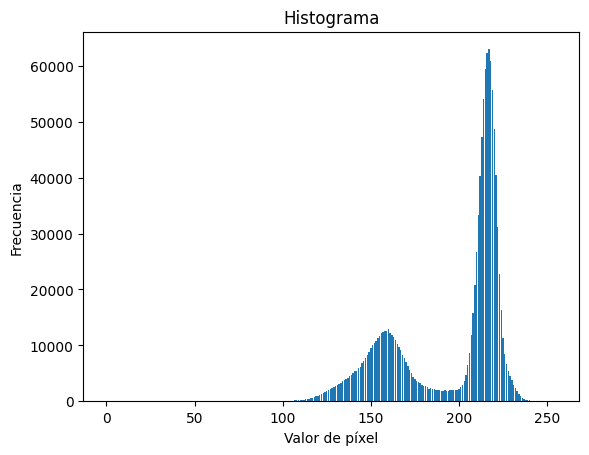

In [ ]:
# Calcula el histograma
histogram = cv2.calcHist([im], [0], None, [256], [0, 256])

# Convierte el histograma a un formato adecuado para graficar
histogram = histogram.flatten()

# Crea una gráfica de barras para visualizar el histograma
plt.bar(range(256), histogram)
plt.xlabel('Valor de píxel')
plt.ylabel('Frecuencia')
plt.title('Histograma')
plt.show()

(-0.5, 1279.5, 959.5, -0.5)

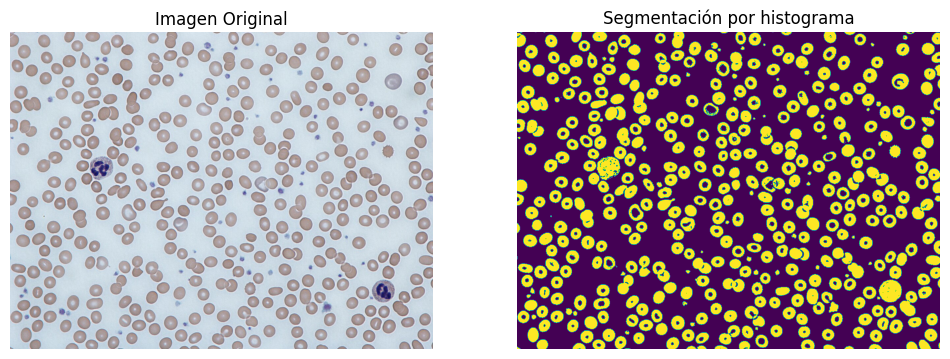

In [ ]:
plt.figure(figsize=(12, 6))  

# Mostrar la imagen original en el lado izquierdo
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))  
plt.title('Imagen Original')
plt.axis('off') 

plt.subplot(1, 2, 2)
plt.imshow(im < 180) 
plt.title('Segmentación por histograma')
plt.axis('off') 


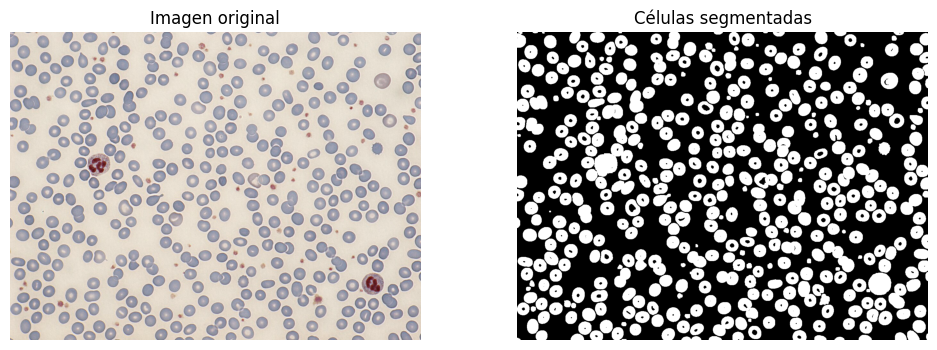

In [ ]:
image_path = '/work/imágenes_proyecto/anemia1.jpg'

cell_threshold = 185 
anemia1_umbralized = umbralized_cells(image_path, cell_threshold)

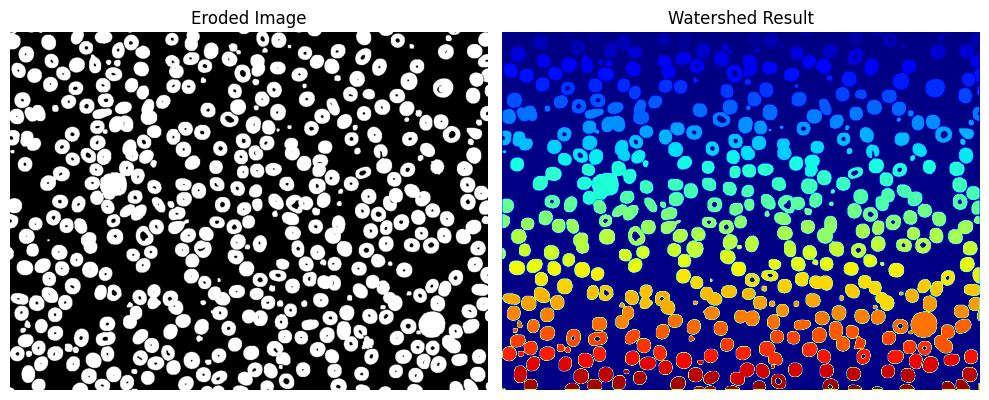

In [ ]:
dist_transform_scale = 0.1
dilate_kernel_size = 3
dilate_iterations = 3
erode_kernel_size = 0
erode_iterations = 0

anemia1_watershed = watershed_cells(anemia1_umbralized, dist_transform_scale, dilate_kernel_size, dilate_iterations, erode_kernel_size, erode_iterations)

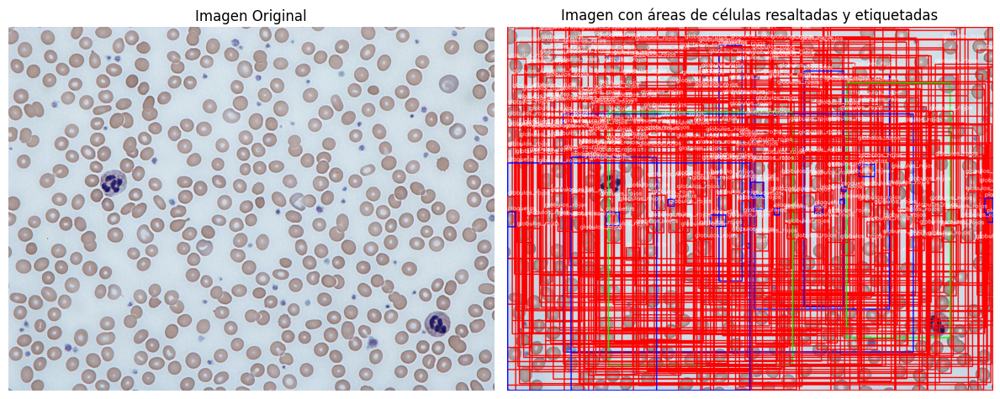

{'globulos_rojos': 232, 'globulos_blancos': 2, 'plaquetas': 20}

In [ ]:
image_path = '/work/imágenes_proyecto/anemia1.jpg'

valor_blancos = 1.0
valor_plaquetas = 0.2
aspect_ratio_threshold = 1.0
compacidad_umbral  = 0.1
solidez_umbral = 0.1
circularidad_umbral = 0.8

mostrar_areas_celulares(image_path, anemia1_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

Porcentaje de resultados positivos: 84.27947598253274%
La persona tiene anemia.
Umbral de intensidad promedio de glóbulos rojos: 190.23843102148132


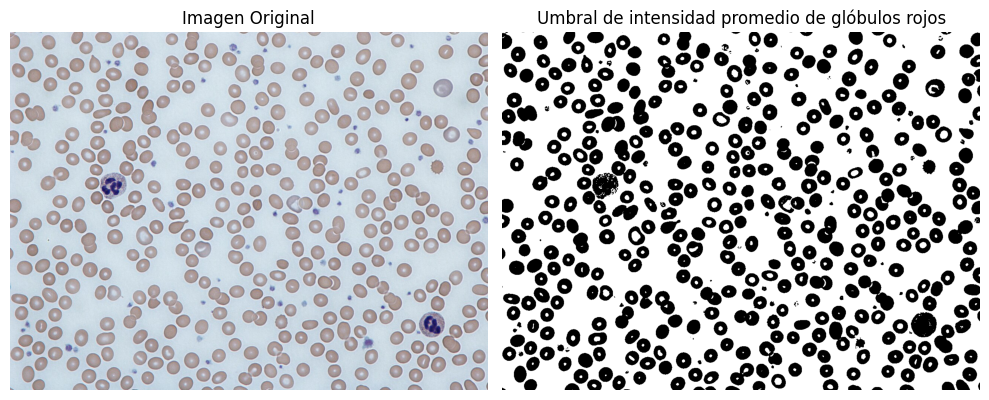

Umbral actual: [198.27173924670797, 197.91939853591919, 192.07161369332422, 195.88177505554555, 175.1189033189033, 200.4112114179387, 196.82704831338845, 199.7377806836137, 169.06589446589447, 198.42072516441675, 200.05272539511495, 200.1832204707342, 198.86940584404277, 200.35376256597792, 201.71070647419072, 199.82608602335165, 195.75431120842634, 198.14981968057702, 197.17423649995686, 199.08560448183306, 198.70132941555883, 197.95932022418228, 198.80791908263333, 196.6848352332285, 198.91320551143764, 199.2523132262683, 199.27684369139376, 204.85492913632447, 198.30532137731004, 198.7043111655107, 199.3050306465008, 196.55255982492017, 200.10038620766304, 197.7583421145065, 199.03190784267173, 199.1562208661751, 197.9262058218349, 198.56197527718433, 188.58599729297404, 188.56791474044536, 200.62731224916368, 197.45080055251736, 197.11556574134704, 198.01612003330445, 198.6413504252883, 196.30080577788559, 198.21498892498852, 198.1088980357085, 193.06596346135876, 197.7373215164943

In [ ]:
valor_blancos = 1.0
valor_plaquetas = 0.2
aspect_ratio_threshold = 1.0
compacidad_umbral  = 0.1
solidez_umbral = 0.1
circularidad_umbral = 0.8

# Llamada a la función
umbral_actual, diagnostico = es_anemia(image_path, anemia1_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

# Imprimir resultado
print(f"Umbral actual: {umbral_actual}")
print(f"Diagnóstico: {diagnostico}")

## Procesamiento segunda imagen

In [ ]:
img2 = cv2.imread('/work/imágenes_proyecto/anemia2.tif')
im = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

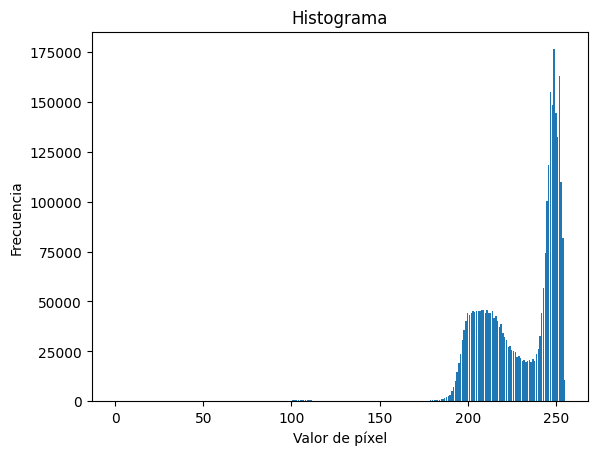

In [ ]:
# Calcula el histograma
histogram = cv2.calcHist([im], [0], None, [256], [0, 256])

# Convierte el histograma a un formato adecuado para graficar
histogram = histogram.flatten()

# Crea una gráfica de barras para visualizar el histograma
plt.bar(range(256), histogram)
plt.xlabel('Valor de píxel')
plt.ylabel('Frecuencia')
plt.title('Histograma')
plt.show()

(-0.5, 2047.5, 1535.5, -0.5)

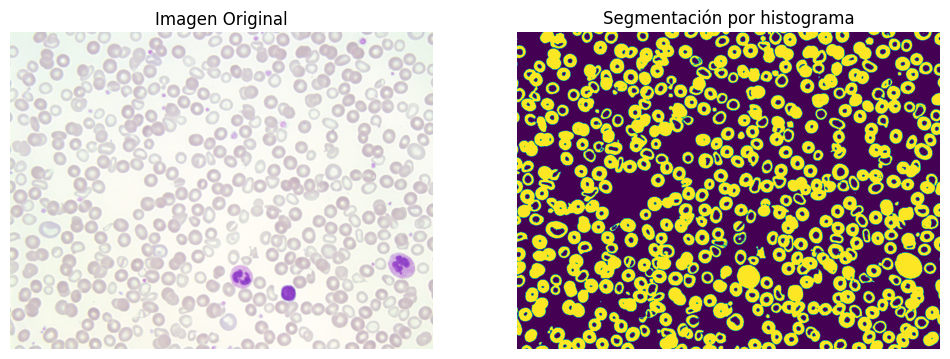

In [ ]:
plt.figure(figsize=(12, 6))  

# Mostrar la imagen original en el lado izquierdo
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))  
plt.title('Imagen Original')
plt.axis('off') 

plt.subplot(1, 2, 2)
plt.imshow(im < 230) 
plt.title('Segmentación por histograma')
plt.axis('off') 


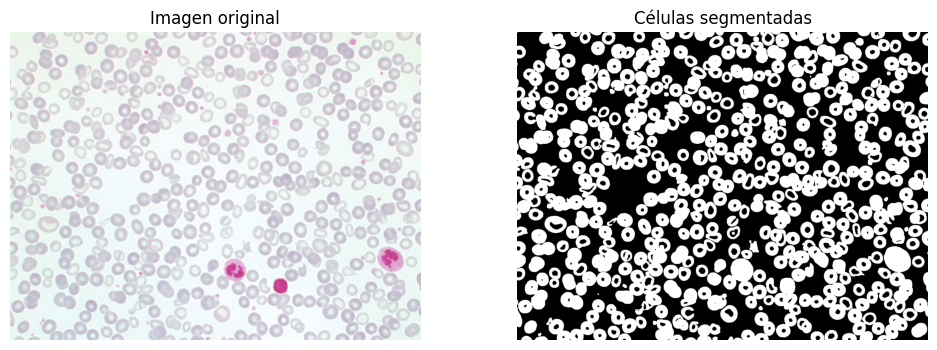

In [ ]:
image_path = '/work/imágenes_proyecto/anemia2.tif'

cell_threshold = 230 
anemia2_umbralized = umbralized_cells(image_path, cell_threshold)

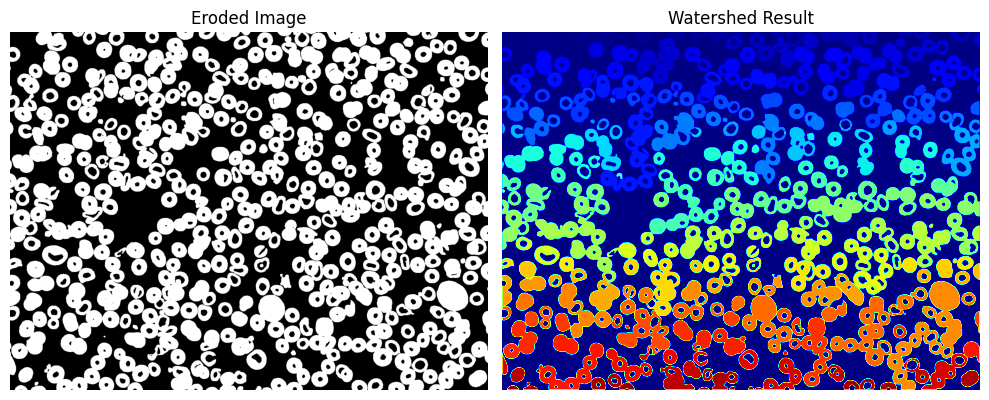

In [ ]:
dist_transform_scale = 0.1
dilate_kernel_size = 3
dilate_iterations = 3
erode_kernel_size = 0
erode_iterations = 0

anemia2_watershed = watershed_cells(anemia2_umbralized, dist_transform_scale, dilate_kernel_size, dilate_iterations, erode_kernel_size, erode_iterations)

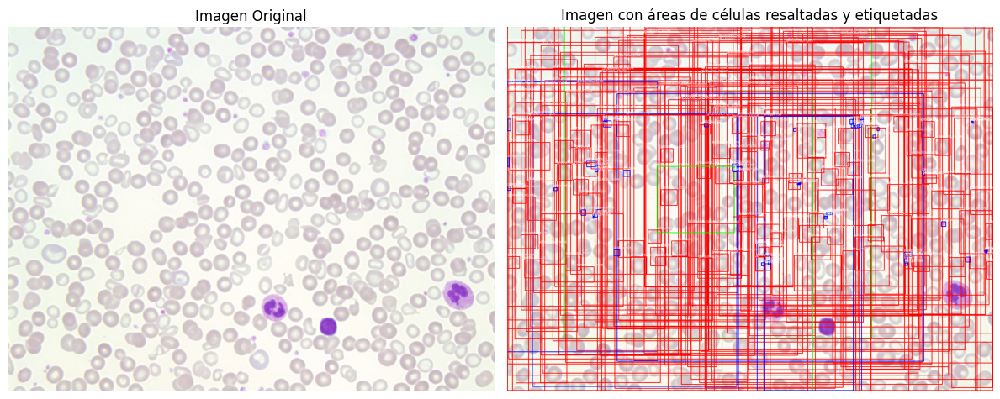

{'globulos_rojos': 189, 'globulos_blancos': 3, 'plaquetas': 62}

In [ ]:
image_path = '/work/imágenes_proyecto/anemia2.tif'

valor_blancos = 2
valor_plaquetas = 0.05
aspect_ratio_threshold = 1.2
compacidad_umbral  = 0.1
solidez_umbral = 0.1
circularidad_umbral = 0.8

mostrar_areas_celulares(image_path, anemia2_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

Porcentaje de resultados positivos: 100.0%
La persona tiene anemia.
Umbral de intensidad promedio de glóbulos rojos: 227.25211704457263


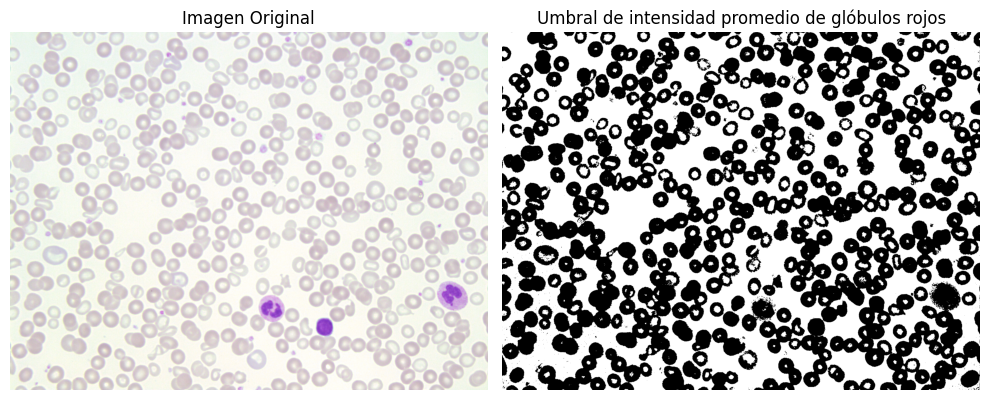

Umbral actual: [230.7742828421009, 231.35458896095093, 231.2921683558071, 230.07929500398242, 229.24453378105926, 232.3861634595924, 230.2658927856352, 232.81595329809176, 233.15001552553952, 232.5286689072207, 231.09563504997828, 233.104280382841, 231.65845557283913, 231.38415766478008, 231.21620609407006, 230.2138399434418, 230.64158396726077, 230.6450838366789, 229.30198610947508, 230.61957420988455, 230.66205194582045, 231.09397376463326, 230.72865203475578, 231.1718063499334, 231.21063750196222, 231.04915967585458, 231.82238735853085, 231.65749562445274, 230.8083510340043, 228.46795472227342, 230.61075911379498, 231.354654191622, 228.66760363208616, 231.1718222463283, 230.58792098372027, 230.46306143550237, 231.67055717250992, 228.79158878504674, 229.17389591429065, 230.06914160978909, 232.5374660756096, 230.0726554630636, 230.57361700201042, 230.64782010078906, 231.83319126261617, 231.3594046104167, 231.1189134581785, 229.99687828864367, 230.48229953459983, 229.7551872606055, 231

In [ ]:
valor_blancos = 2
valor_plaquetas = 0.05
aspect_ratio_threshold = 1.2
compacidad_umbral  = 0.1
solidez_umbral = 0.1
circularidad_umbral = 0.8

# Llamada a la función
umbral_actual, diagnostico = es_anemia(image_path, anemia2_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

# Imprimir resultado
print(f"Umbral actual: {umbral_actual}")
print(f"Diagnóstico: {diagnostico}")

## Procesamiento tercera imagen

In [ ]:
img3 = cv2.imread('/work/imágenes_proyecto/anemia3.jpg')
im = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

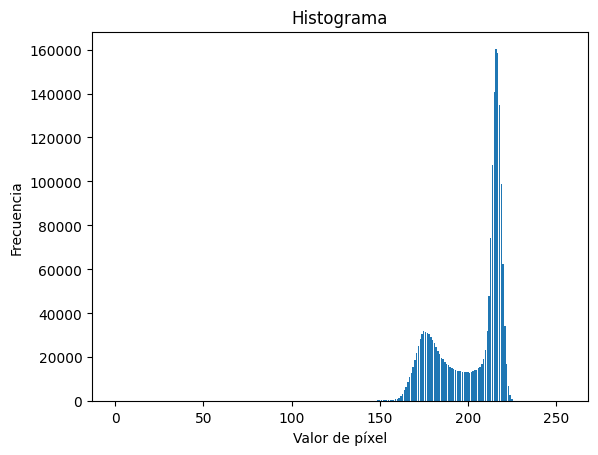

In [ ]:
# Calcula el histograma
histogram = cv2.calcHist([im], [0], None, [256], [0, 256])

# Convierte el histograma a un formato adecuado para graficar
histogram = histogram.flatten()

# Crea una gráfica de barras para visualizar el histograma
plt.bar(range(256), histogram)
plt.xlabel('Valor de píxel')
plt.ylabel('Frecuencia')
plt.title('Histograma')
plt.show()

(-0.5, 1615.5, 1215.5, -0.5)

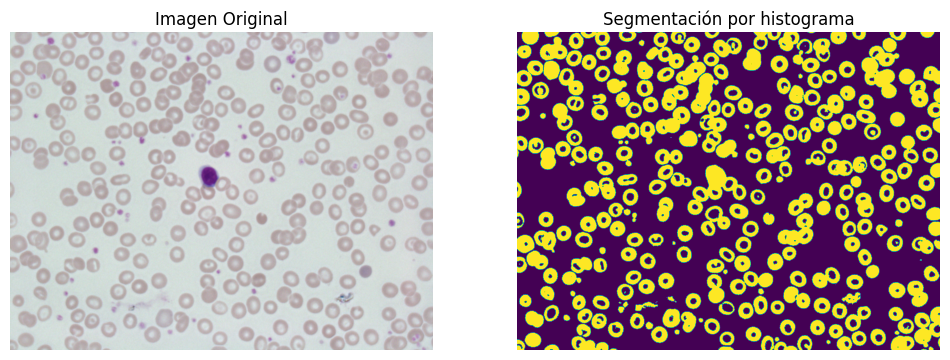

In [ ]:
plt.figure(figsize=(12, 6))  

# Mostrar la imagen original en el lado izquierdo
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))  
plt.title('Imagen Original')
plt.axis('off') 

plt.subplot(1, 2, 2)
plt.imshow(im < 200) 
plt.title('Segmentación por histograma')
plt.axis('off') 


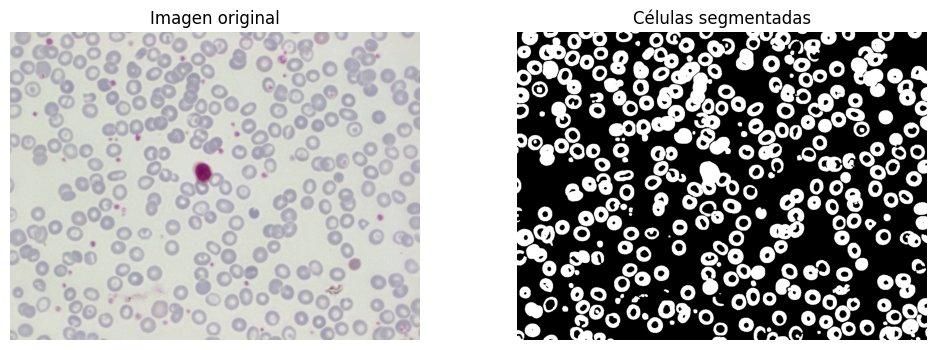

In [ ]:
image_path = '/work/imágenes_proyecto/anemia3.jpg'

cell_threshold = 190 
anemia3_umbralized = umbralized_cells(image_path, cell_threshold)

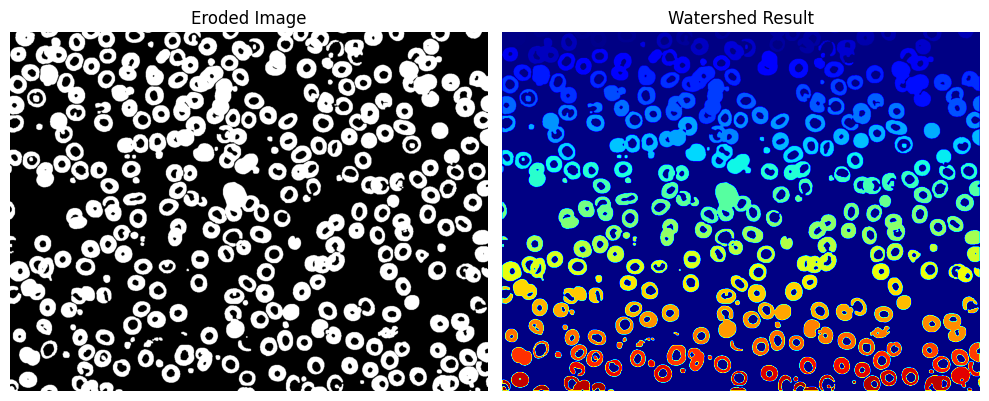

In [ ]:
dist_transform_scale = 0.1
dilate_kernel_size = 0
dilate_iterations = 0
erode_kernel_size = 0
erode_iterations = 0

anemia3_watershed = watershed_cells(anemia3_umbralized, dist_transform_scale, dilate_kernel_size, dilate_iterations, erode_kernel_size, erode_iterations)

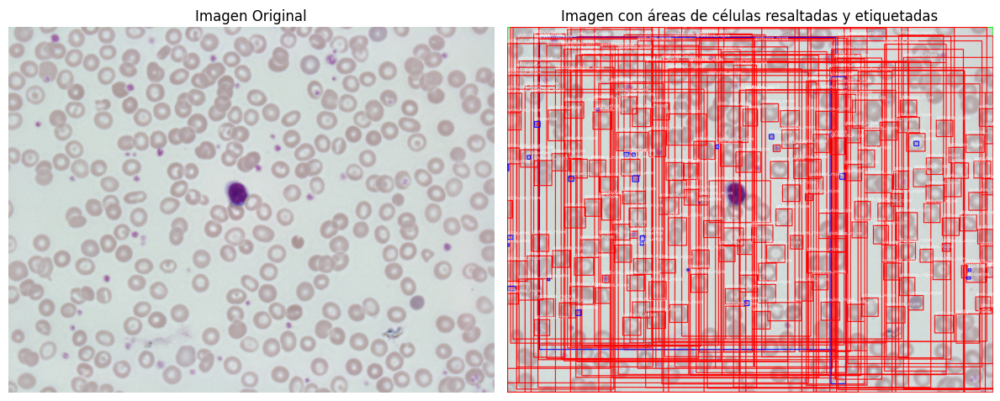

{'globulos_rojos': 227, 'globulos_blancos': 1, 'plaquetas': 26}

In [ ]:
image_path = '/work/imágenes_proyecto/anemia3.jpg'

valor_blancos = 2
valor_plaquetas = 0.05
aspect_ratio_threshold = 2
compacidad_umbral  = 0.1
solidez_umbral = 0.1
circularidad_umbral = 0.8

mostrar_areas_celulares(image_path, anemia3_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

Porcentaje de resultados positivos: 97.79735682819384%
La persona tiene anemia.
Umbral de intensidad promedio de glóbulos rojos: 192.75473694327178


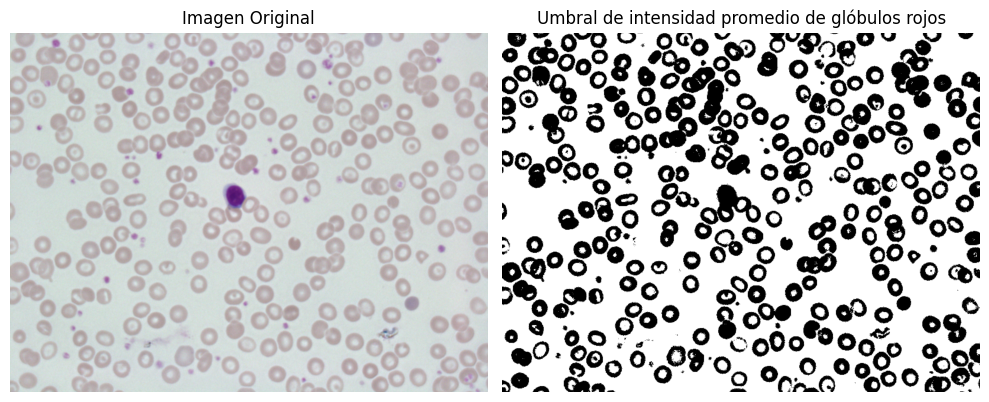

Umbral actual: [201.5713655661411, 201.26426892073445, 201.95099104149878, 201.3404271023684, 201.40652064840734, 201.58850069288988, 200.17895179152072, 201.35849317835687, 201.450127100303, 202.0232977826963, 201.54360801718533, 202.5097217215864, 201.74831360363967, 201.88612048460988, 201.62793772160776, 201.3735261503007, 201.15503577817532, 198.62374155066735, 200.57597052029777, 201.88645229353398, 202.47792656829517, 202.5647908915366, 201.57888714971577, 199.4454214724838, 201.6637781570702, 201.46183077763723, 201.77036270983214, 203.039012215519, 201.78528457035753, 201.6568127511676, 202.20307402338054, 201.47567448860988, 201.63221388421263, 201.18471925209107, 201.71107129296786, 200.48903354994422, 202.74936157618805, 201.42789321835522, 201.85012941796893, 201.77788646116335, 201.8677594886808, 201.7772308978665, 202.0546911920104, 202.83676654182273, 202.14755039615113, 201.92243757274179, 202.18325464456788, 202.00236302392415, 202.14582813418662, 202.15533880198367, 

In [ ]:
valor_blancos = 2
valor_plaquetas = 0.05
aspect_ratio_threshold = 1.5
compacidad_umbral  = 0.1
solidez_umbral = 0.1
circularidad_umbral = 0.8

# Llamada a la función
umbral_actual, diagnostico = es_anemia(image_path, anemia3_watershed, valor_blancos, valor_plaquetas, aspect_ratio_threshold, compacidad_umbral, solidez_umbral, circularidad_umbral)

# Imprimir resultado
print(f"Umbral actual: {umbral_actual}")
print(f"Diagnóstico: {diagnostico}")

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=9e073c2a-8d81-4250-a281-09b4219670d6' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>